# Веб Базирани Системи - ФИНКИ 2022/2023
---
## Проектна задача
### Тема: Анализа на криминалистички податоци од Македонија
---
## Виктор Мегленовски - 191001
---
Линк до податочно множество: http://crimemap.finki.ukim.mk/data/mk

## 1. Инсталирање и импортирање на потребните модули и библиотеки
---

In [ ]:
!pip install beautifulsoup4
!pip install lxml

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from bs4 import BeautifulSoup
import xml.etree.ElementTree as ET
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Вчитување на податоците
---

In [ ]:
tree = ET.parse('/content/drive/MyDrive/crimemap_nastani.xml')
root = tree.getroot()

data = []
for child in root:
    row = {}
    for subchild in child:
        row[subchild.tag] = subchild.text
    data.append(row)

original_df = pd.DataFrame(data)

In [ ]:
original_df.head()

,nastan_id,shto,grad,datum,lat,lng,opis
0,1,насилство,Скопје,24.06.2011,41.9616704,21.5075581,"На 24.06.2011 година, СВР-Скопје, со кривична ..."
1,2,насилство,Штип,24.06.2011,41.75,22.2,"На 24.06.2011 година М.С.(1962) од Штип, во С..."
2,3,кражба,Скопје,24.06.2011,42.003812,21.452246,"Ноќта помеѓу 23 и 24.06.2011 година, во перио..."
3,4,кражба,Скопје,24.06.2011,41.9980329,21.4344496,"На 24.06.2011 година околу 15,40 часот во Ско..."
4,5,сообраќај,Куманово,24.06.2011,42.13337,21.72584,На 24.06.2011 година СВР-Куманово до ОЈО-Кума...


In [ ]:
df = original_df.copy()

## 3. Справување со вредности кои недостасуваат
---

In [ ]:
missing_values = df.isnull().sum()
percentage = 100 * df.isnull().sum() / len(df)
missing_values_table = pd.concat([missing_values, percentage], axis=1)
missing_values_table.columns = ['Num. of missing values','% of missing values']
print(missing_values_table)

           Num. of missing values  % of missing values
nastan_id                       0             0.000000
shto                            0             0.000000
grad                          616             1.333131
datum                           0             0.000000
lat                             0             0.000000
lng                             0             0.000000
opis                            6             0.012985


Постојат неколку типови на аномалии кои што се сретнуваат во податоците:

*   Празна вредност за датум
*   Датум 00.00.0000
*   Датум со година 0, 7, 204, 2025, 1969
*   Датум со месец 0
*   Празна вредност за град

За справување со сите овие аномалии, соодветните записи се отстранети.
Дополнително, колоните ИД и опис се отстранети бидејќи не се потребни во понатамошната анализа.


In [ ]:
df.drop(['nastan_id','opis'],axis=1,inplace=True)
df = df.drop(df[df['datum'] == '00.00.0000'].index)
df = df.drop(df[df['grad'] == ''].index)
df = df.drop(df[df['grad'].isnull()].index)
df['month'] = df['datum'].apply(lambda x: x.split('.')[-2])
df['year'] = df['datum'].apply(lambda x: x.split('.')[-1])
df['month'] = df['month'].astype('int32')
df['year'] = df['year'].astype('int32')
df['shto'] = df['shto'].astype('category')
df['grad'] = df['grad'].astype('category')
df['lat'] = df['lat'].astype('float64')
df['lng'] = df['lng'].astype('float64')

df = df.drop(df[df['month'] == 0].index)
df = df.drop(df[df['year'] == 0].index)
df = df.drop(df[df['year'] == 7].index)
df = df.drop(df[df['year'] == 204].index)
df = df.drop(df[df['year'] == 2025].index)
df = df.drop(df[df['year'] == 1969].index)

In [ ]:
missing_values = df.isnull().sum()
percentage = 100 * df.isnull().sum() / len(df)
missing_values_table = pd.concat([missing_values, percentage], axis=1)
missing_values_table.columns = ['Num. of missing values','% of missing values']
print(missing_values_table)

       Num. of missing values  % of missing values
shto                        0                  0.0
grad                        0                  0.0
datum                       0                  0.0
lat                         0                  0.0
lng                         0                  0.0
month                       0                  0.0
year                        0                  0.0


После чистењето на податоците, не постојат вредности кои недостастуваат.

In [ ]:
df.head()

,shto,grad,datum,lat,lng,month,year
0,насилство,Скопје,24.06.2011,41.961670,21.507558,6,2011
1,насилство,Штип,24.06.2011,41.750000,22.200000,6,2011
2,кражба,Скопје,24.06.2011,42.003812,21.452246,6,2011
3,кражба,Скопје,24.06.2011,41.998033,21.434450,6,2011
4,сообраќај,Куманово,24.06.2011,42.133370,21.725840,6,2011


## 4. Основна анализа врз сите податоци
---

### 4.1. Приказ на сите настани на мапа

In [ ]:
all_coordinates=[]
for index, row in df.iterrows():
  all_coordinates.append([row['lat'],row['lng']])


In [ ]:
map_center = [all_coordinates[0][0], all_coordinates[0][1]]
map = folium.Map(location=map_center, zoom_start=10)

for coord in all_coordinates:
    folium.Marker(location=[coord[0], coord[1]]).add_to(map)

In [ ]:
map

---

### 4.2. Анализа по градови

In [ ]:
df['grad'].value_counts()

Скопје                 13648
Прилеп                  3961
Тетово                  3918
Битола                  2707
Куманово                2434
Гостивар                2185
Штип                    1802
Охрид                   1517
Струмица                1288
Велес                   1259
Берово                  1041
Кичево                   902
Струга                   842
Македонски Брод          842
Кочани                   534
Гевгелија                514
Кавадарци                468
Неготино                 386
Делчево                  316
Дебар                    311
Радовиш                  309
Свети Николе             249
Крива Паланка            232
Виница                   177
Ресен                    176
Крушево                  128
Демир Капија             119
Валандово                119
Пробиштип                116
Кратово                  107
Македонска Каменица       71
Богданци                  48
Пехчево                   34
Демир Хисар               31
Name: grad, dt

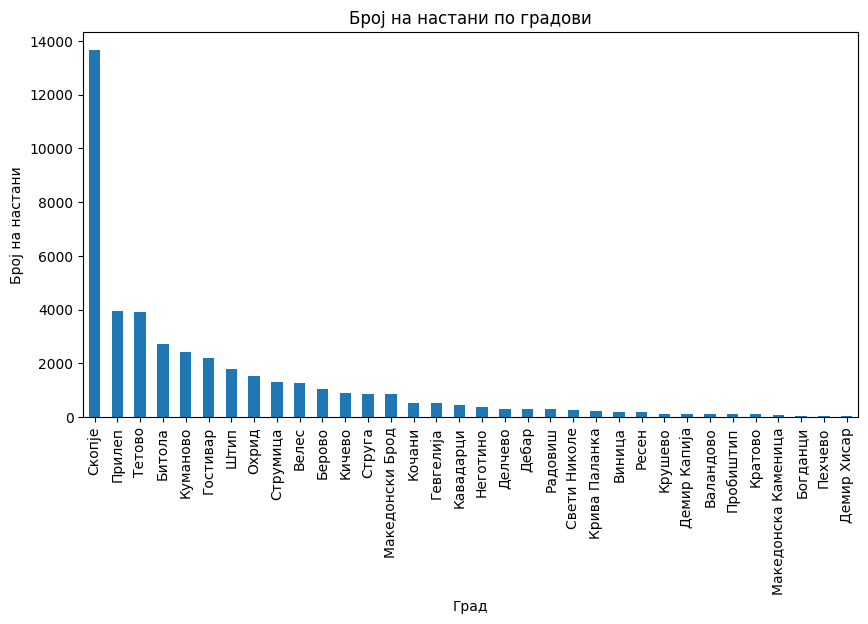

In [ ]:
plt.figure(figsize=(10, 5))
df['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (13648), потоа во Прилеп (3961) и Тетово (3918), додека пак најмалце во Пехчево (34) и Демир Хисар (31).

---

### 4.3. Анализа по тип на настан

In [ ]:
df['shto'].value_counts()

друго        15829
сообраќај    10333
кражба        5766
насилство     5756
дрога         2238
пиштол        1784
документи     1085
Name: shto, dtype: int64

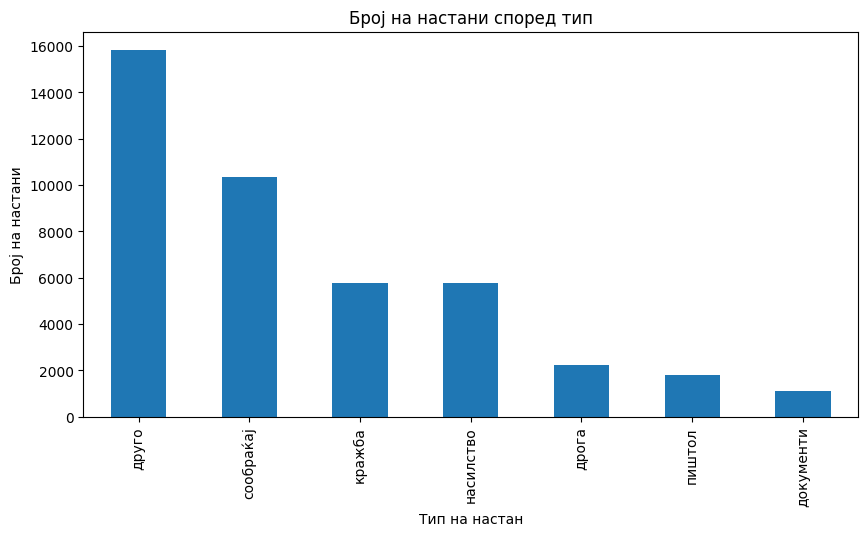

In [ ]:
plt.figure(figsize=(10, 5))
df['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните не се класифицирани во точна класа. Според класите, најголем дел од настаните се поврзани со сообраќај.

---

### 4.4. Анализа по градови и тип на настан

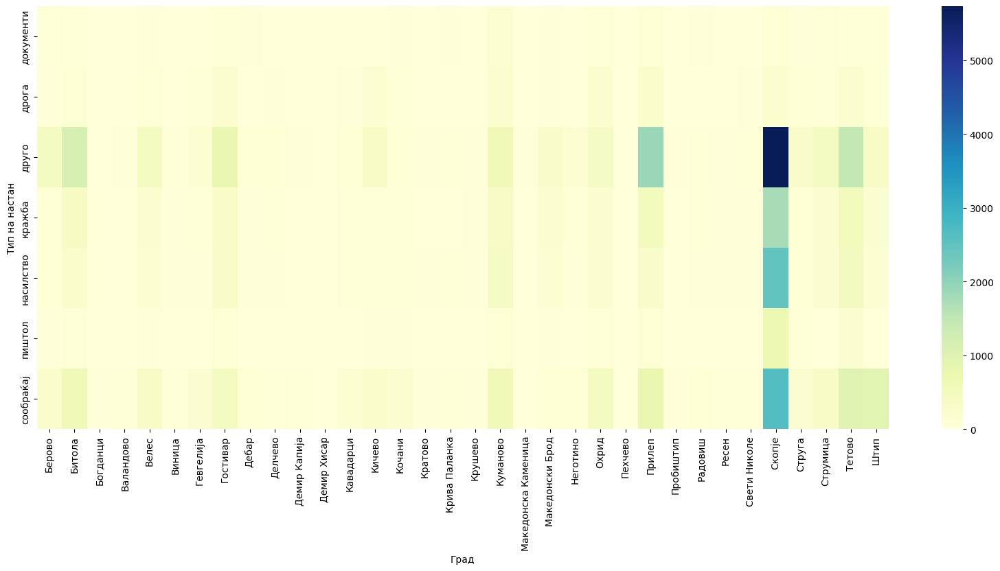

In [ ]:
grouped = df.groupby(['shto', 'grad']).size().reset_index(name='count')
pivot = grouped.pivot(index='shto', columns='grad', values='count')
plt.figure(figsize=(20, 8))
sns.heatmap(pivot, cmap='YlGnBu')
plt.xlabel('Град')
plt.ylabel('Тип на настан')
plt.show()

Горниот дијаграм нагласува дека најголем дел од настаните се класифицирани како „друго“ и се случиле во Скопје.

---

### 4.5. Анализа по координати

Просечни координати од сите настани:

In [ ]:
mean_lat=df['lat'].mean()
mean_lng=df['lng'].mean()
print(mean_lat)
print(mean_lng)

41.71730637210061
21.534627666090014


In [ ]:
map_center = [mean_lat, mean_lng]
map = folium.Map(location=map_center, zoom_start=10)

folium.Marker(location=[mean_lat, mean_lng]).add_to(map)

In [ ]:
map

Просечните координати од сите настани се во централниот дел, но значително тежнеат кон главниот град Скопје.

---

### 4.6. Денови со најмногу настани

In [ ]:
df['datum'].value_counts()[1:20]

15.02.2022    78
30.09.2021    73
08.06.2021    71
01.12.2021    71
06.09.2021    68
05.07.2021    64
02.10.2021    64
08.12.2021    63
17.02.2022    62
22.10.2021    62
11.12.2021    62
29.12.2021    62
07.02.2022    60
06.11.2021    60
19.02.2022    60
30.04.2021    60
23.10.2021    60
05.11.2021    58
16.07.2021    56
Name: datum, dtype: int64

Дури 18 од првите 20 денови со најголем број на регистрирани настани се случиле во 2021 година.

---

### 4.7. Анализа по години

In [ ]:
df['year'].value_counts()

2021    11217
2022     8466
2020     4548
2016     2447
2023     2163
2017     1972
2018     1961
2014     1819
2015     1765
2019     1742
2013     1678
2012     1402
2011     1173
2002       57
2001       57
2009       56
2010       54
2008       47
2007       43
2006       36
2003       34
2004       27
2005       25
2000        2
Name: year, dtype: int64

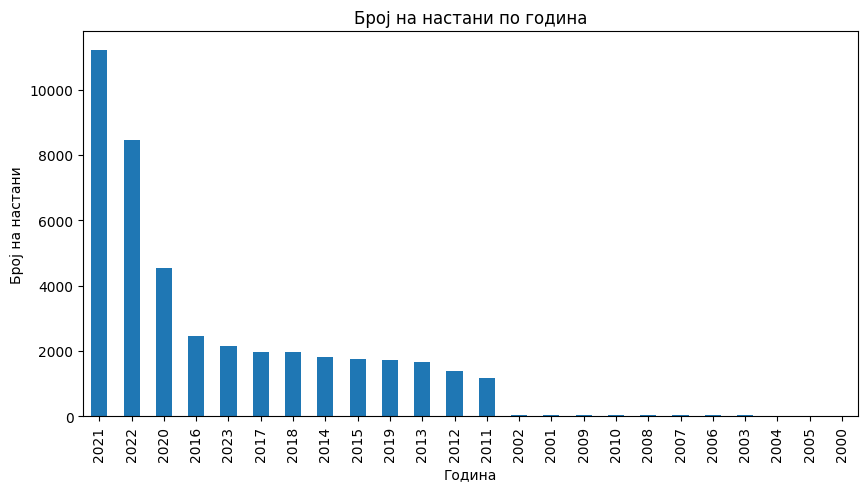

In [ ]:
plt.figure(figsize=(10, 5))
df['year'].value_counts().plot(kind='bar')
plt.xlabel('Година')
plt.ylabel('Број на настани')
plt.title("Број на настани по година")
plt.show()

Најголем број на регистирани настани има во 2021 година. Општо гледано почнувајќи од претходната деценија, има значително зголемување на бројот на настани во споредба со претходните децении. Оваа драстична разлика е предизвикана од развојот и интегрирањето на технологијата во државните институции на почетокот од претходната деценија (2011 година).

---

### 4.8. Анализа по месеци

In [ ]:
df['month'].value_counts()

2     4191
12    4024
10    3897
8     3786
9     3776
11    3721
1     3585
3     3520
7     3472
4     3007
6     2999
5     2813
Name: month, dtype: int64

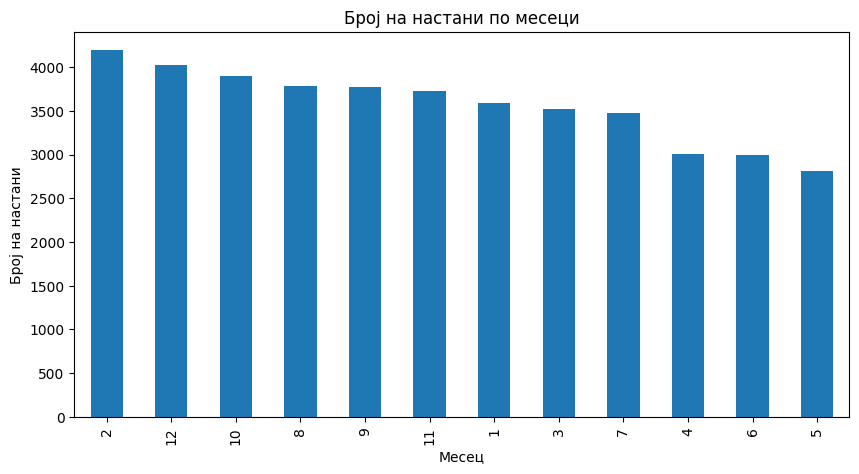

In [ ]:
plt.figure(figsize=(10, 5))
df['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Иако нема драстични разлики во бројот на пријавени настани во различни месеци, може да се заклучи дека најголем број од настаните се случувале во Февруари, Октомври и Декември, додека пак најмалку во Април, Мај и Јуни.

---

### 4.9. Анализа по месеци и години

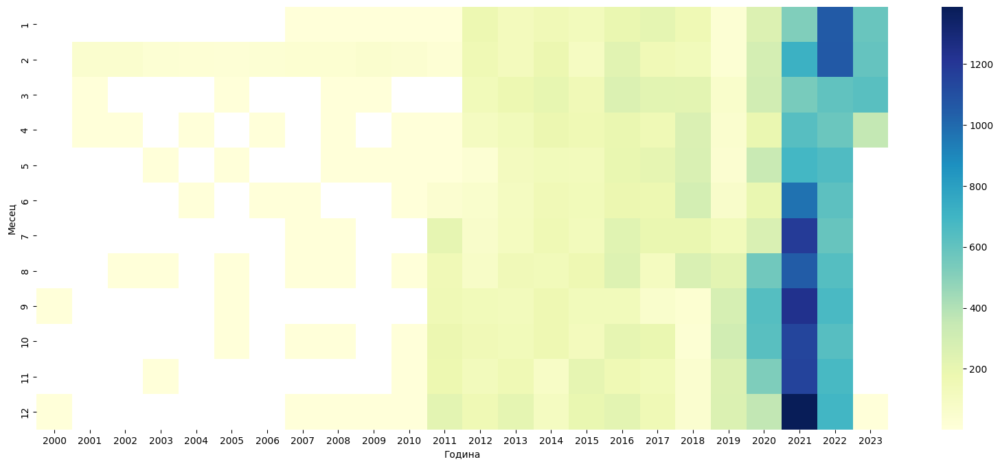

In [ ]:
grouped = df.groupby(['month', 'year']).size().reset_index(name='count')
pivot = grouped.pivot(index='month', columns='year', values='count')
plt.figure(figsize=(20, 8))
sns.heatmap(pivot, cmap='YlGnBu')
plt.xlabel('Година')
plt.ylabel('Месец')
plt.show()

Горниот дијаграм покажува дека најмногу настани биле регистрирани во втората половина од 2021 година, како и во првиот квартал од 2022 година. Општо гледано, во 2021 и 2022 година биле регистрирани значително поголем број на настани во споредба со останатите години.

---

## 5. Анализа на годишни податоци од 2012 до 2022 година
---

Во оваа секција се прави анализа на податоците во период од 2012 до 2022 година, за секоја година посебно.

### 5.1. 2012 година

In [ ]:
df_new=df[df['year'] == 2012]

In [ ]:
df_new.shape[0]

1402

Во 2012 биле регистрирани вкупно 1402 настани.

---

#### 5.1.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 276
Куманово               155
Тетово                 136
Битола                 129
Прилеп                 115
Струмица                82
Охрид                   73
Штип                    57
Гостивар                57
Велес                   46
Струга                  37
Радовиш                 26
Делчево                 26
Берово                  23
Кичево                  22
Кочани                  21
Крива Паланка           16
Гевгелија               16
Ресен                   14
Македонски Брод         13
Кавадарци               12
Свети Николе            10
Дебар                    8
Крушево                  8
Пробиштип                5
Виница                   5
Неготино                 4
Кратово                  3
Демир Хисар              2
Македонска Каменица      2
Валандово                2
Демир Капија             1
Пехчево                  0
Богданци                 0
Name: grad, dtype: int64

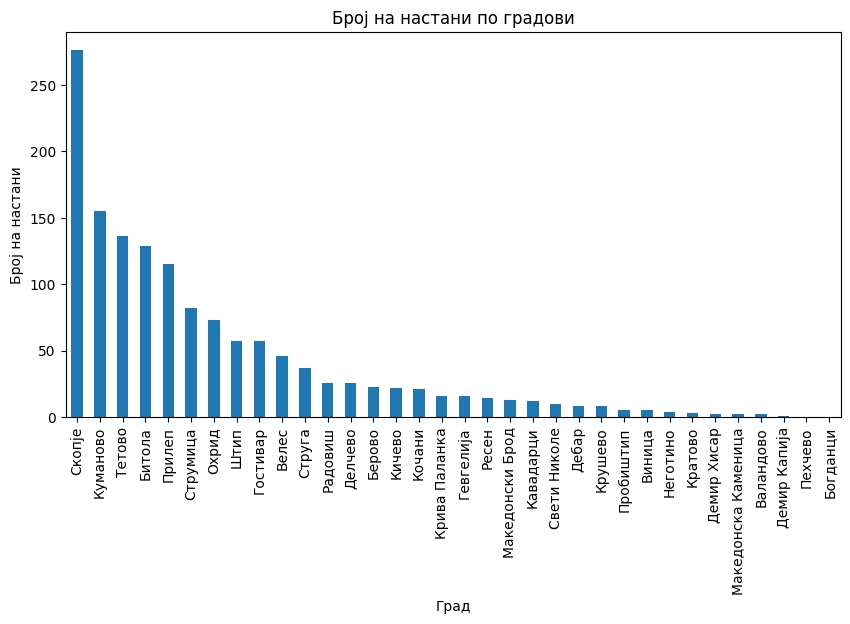

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (276), а најмалце во Пехчево (0) и Богданци (0).

---

#### 5.1.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

кражба       330
друго        292
насилство    288
сообраќај    155
пиштол       127
дрога        122
документи     88
Name: shto, dtype: int64

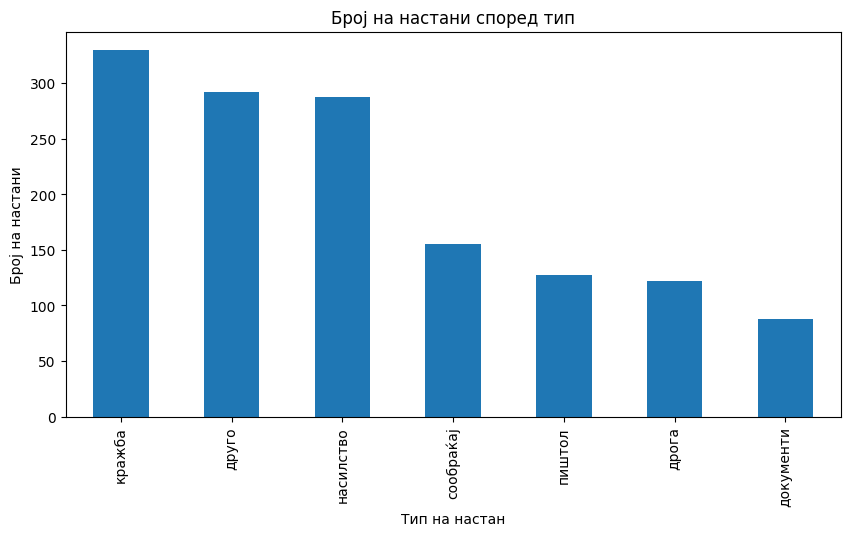

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле кражби, а потоа насилство и некласифицирани.

---

#### 5.1.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

1     173
2     163
12    160
10    148
9     141
3     139
11    129
4     108
8      82
7      70
6      58
5      31
Name: month, dtype: int64

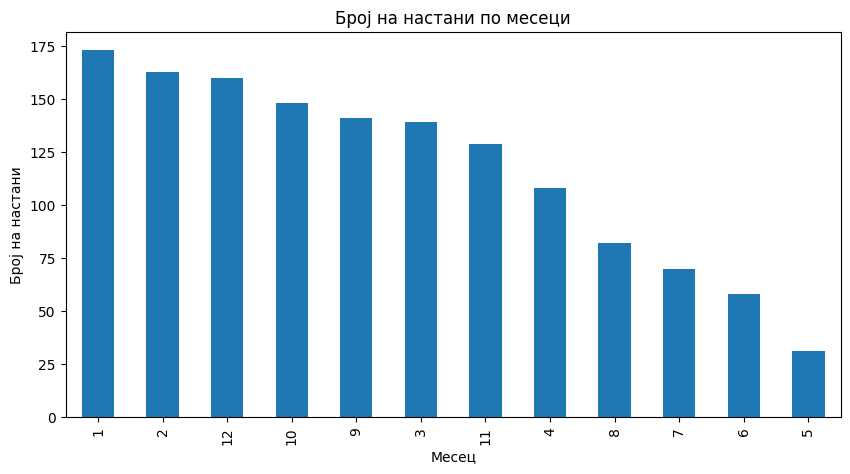

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во зимските месеци (Јануари, Февруари, Декември), додека пак најмалце во Мај, Јуни и Јули.

---

#### 5.1.4. Анализа по градови и тип на настан

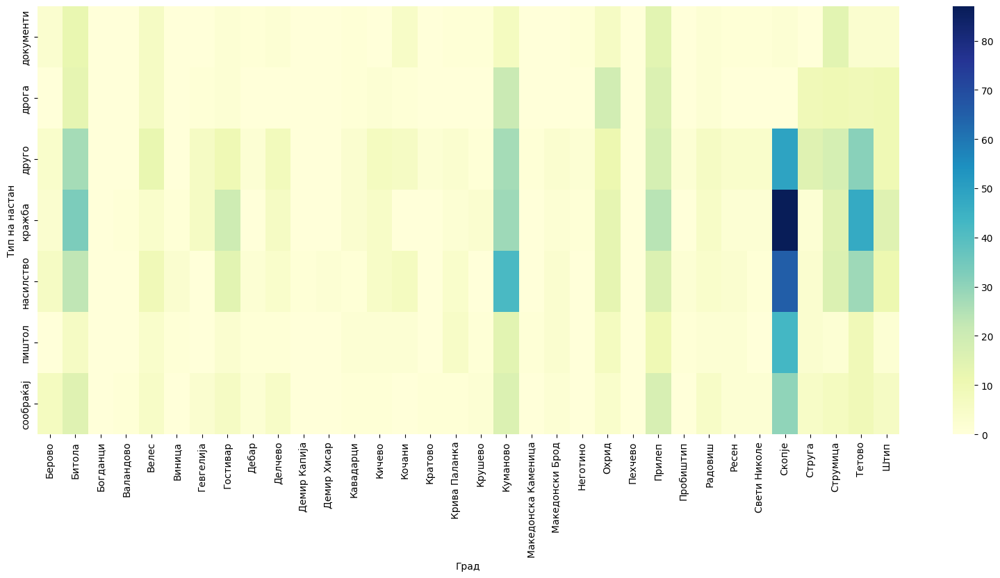

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Најмногу кражби се случиле во Скопје, Тетово и Битола. Во Скопје, Куманово и Тетово се случиле најмногу настани поврзани со насилство.

---

### 5.2. 2013 година

In [ ]:
df_new=df[df['year'] == 2013]

In [ ]:
df_new.shape[0]

1678

Во 2013 биле регистрирани вкупно 1678 настани.

---

#### 5.2.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 339
Куманово               202
Тетово                 157
Прилеп                 150
Битола                 146
Охрид                   82
Струмица                76
Гостивар                75
Струга                  57
Штип                    46
Македонски Брод         43
Кичево                  32
Кочани                  32
Гевгелија               30
Велес                   30
Радовиш                 26
Крива Паланка           25
Делчево                 23
Кавадарци               19
Берово                  16
Дебар                   12
Ресен                   10
Неготино                 9
Свети Николе             9
Виница                   9
Пробиштип                6
Крушево                  6
Демир Капија             3
Македонска Каменица      2
Кратово                  2
Пехчево                  1
Демир Хисар              1
Валандово                1
Богданци                 1
Name: grad, dtype: int64

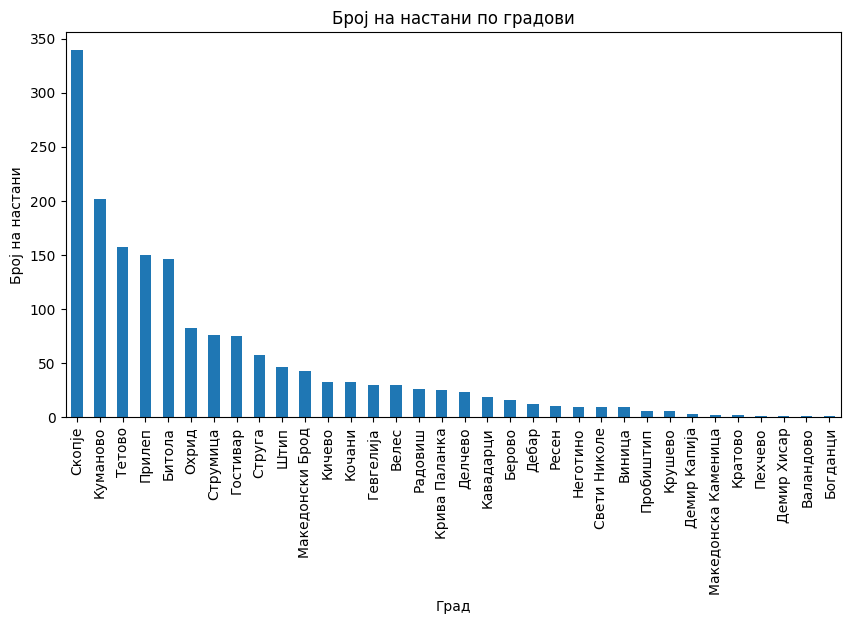

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (339), а најмалце во Пехчево (0), Богданци (0), Валандово (0) и Демир Хисар (0).

---

#### 5.2.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

кражба       401
насилство    358
друго        235
сообраќај    205
дрога        202
пиштол       161
документи    116
Name: shto, dtype: int64

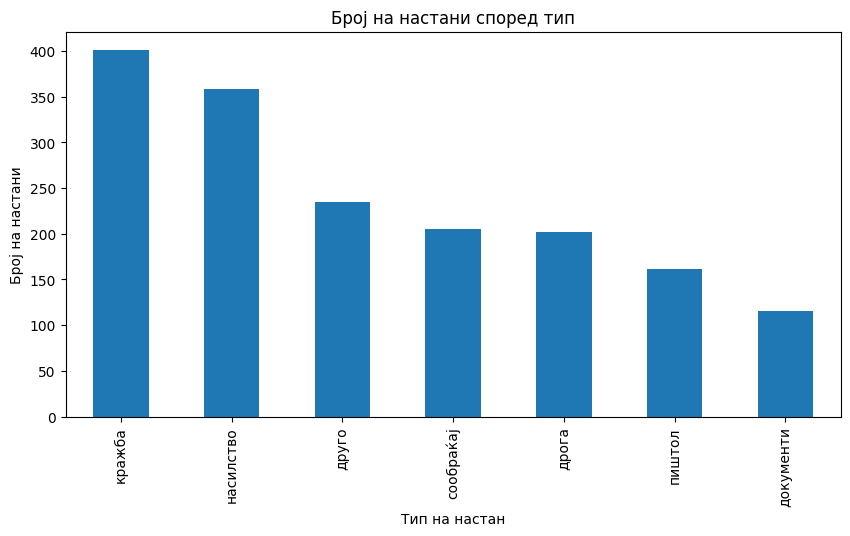

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле кражби, а потоа насилство.

---

#### 5.2.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

12    214
3     174
11    159
8     147
10    141
4     132
9     128
1     125
2     123
5     120
7     111
6     104
Name: month, dtype: int64

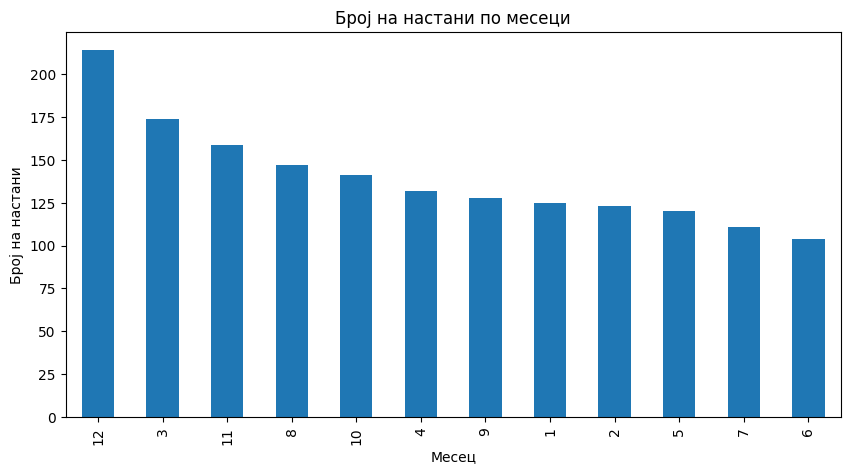

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Декември, додека пак најмалце Јуни.

---

#### 5.2.4. Анализа по градови и тип на настан

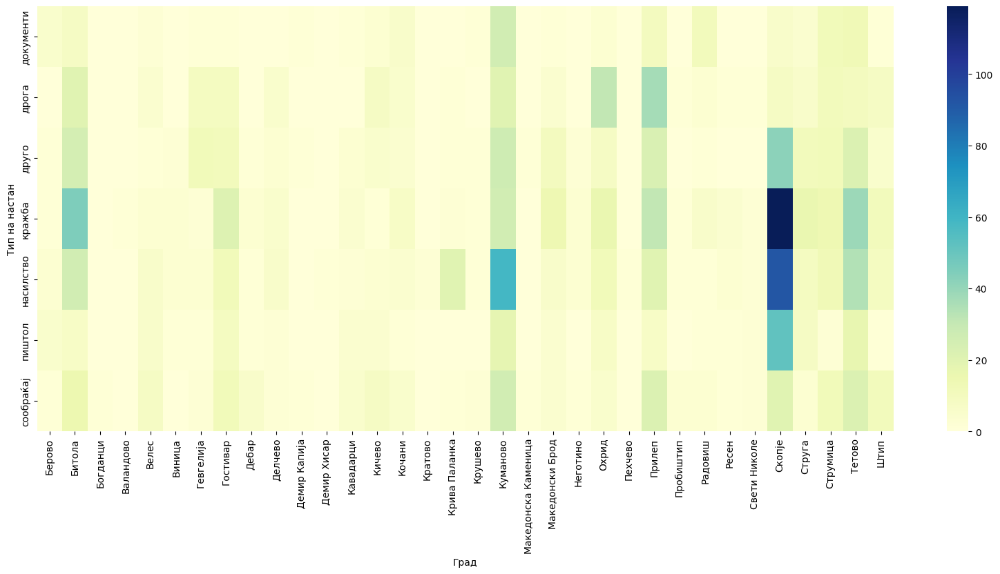

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Најмногу кражби се случиле во Скопје, Тетово и Битола. Во Скопје и Куманово се случиле најмногу настани поврзани со насилство.

---

### 5.3. 2014 година

In [ ]:
df_new=df[df['year'] == 2014]

In [ ]:
df_new.shape[0]

1819

Во 2014 биле регистрирани вкупно 1819 настани.

---

#### 5.3.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 360
Македонски Брод        190
Тетово                 173
Куманово               166
Прилеп                 122
Битола                 119
Охрид                   91
Гостивар                91
Струмица                69
Штип                    56
Струга                  53
Гевгелија               45
Радовиш                 32
Велес                   30
Кичево                  29
Делчево                 25
Кочани                  24
Ресен                   18
Берово                  15
Дебар                   15
Крушево                 14
Кавадарци               13
Крива Паланка           12
Кратово                  9
Свети Николе             9
Неготино                 8
Пробиштип                8
Виница                   6
Валандово                5
Демир Капија             4
Македонска Каменица      2
Пехчево                  2
Демир Хисар              2
Богданци                 2
Name: grad, dtype: int64

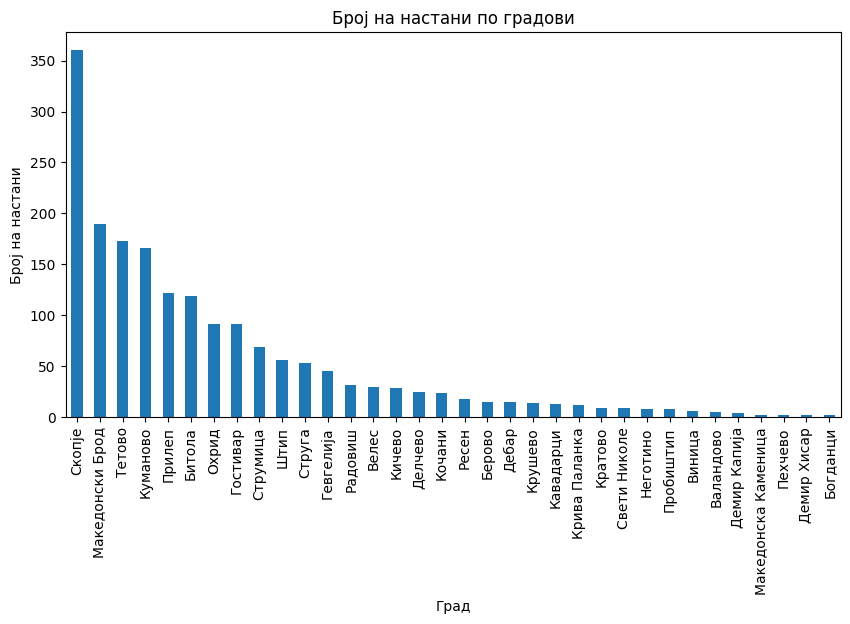

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (360), а најмалце во Пехчево (2), Богданци (2), Македонска Каменица (2) и Демир Хисар (2). За разлика од претходните години, во 2014 година, Македонски Брод е втор по број на регистрирани настани.

---

#### 5.3.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

кражба       457
друго        337
насилство    281
сообраќај    233
дрога        207
пиштол       161
документи    143
Name: shto, dtype: int64

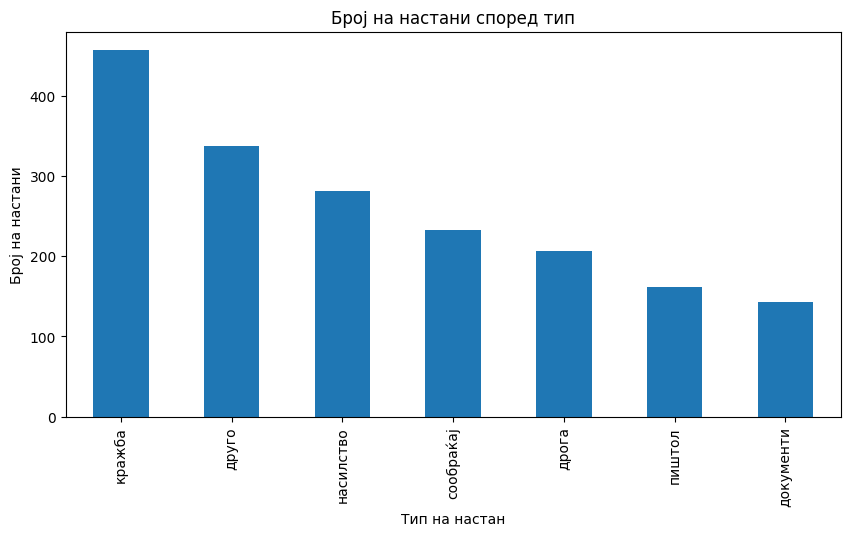

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле кражби.

---

#### 5.3.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

3     202
2     181
4     181
10    165
9     164
7     159
1     152
6     151
8     140
5     132
12    106
11     86
Name: month, dtype: int64

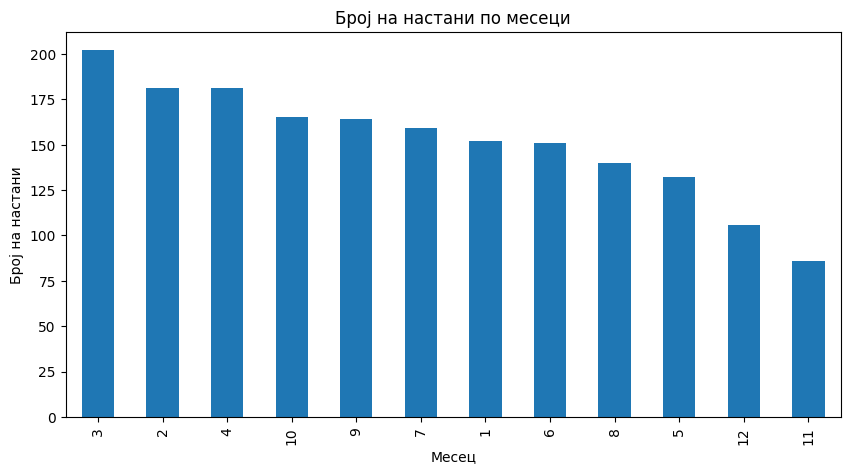

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Февруари, Март и Април, додека пак најмалце во Ноември и Декември.

---

#### 5.3.4. Анализа по градови и тип на настан

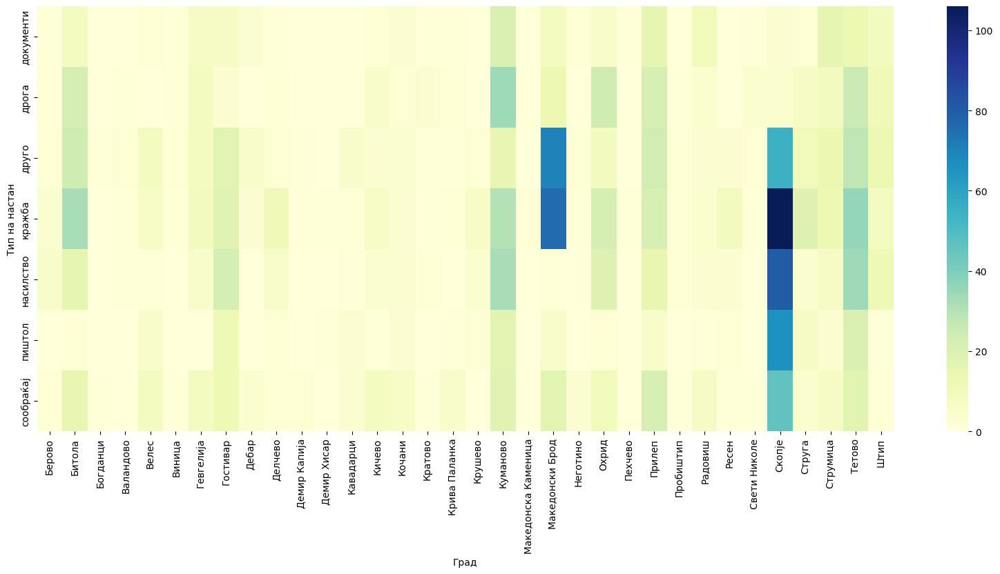

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Најмногу кражби и некласифицирани настани се случиле во Скопје и Македонски Брод. Потоа следат Битола, Тетово и Куманово.

---

### 5.4. 2015 година

In [ ]:
df_new=df[df['year'] == 2015]

In [ ]:
df_new.shape[0]

1765

Во 2015 биле регистрирани вкупно 1765 настани.

---

#### 5.4.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 387
Прилеп                 184
Куманово               167
Тетово                 146
Битола                 129
Гостивар                95
Штип                    81
Охрид                   76
Струга                  69
Македонски Брод         55
Струмица                51
Гевгелија               49
Велес                   42
Кочани                  29
Неготино                28
Кичево                  25
Радовиш                 25
Делчево                 17
Дебар                   14
Ресен                   14
Кавадарци               13
Берово                  12
Свети Николе             9
Виница                   9
Крушево                  7
Крива Паланка            6
Кратово                  6
Македонска Каменица      5
Пробиштип                5
Демир Капија             3
Валандово                3
Богданци                 2
Пехчево                  1
Демир Хисар              1
Name: grad, dtype: int64

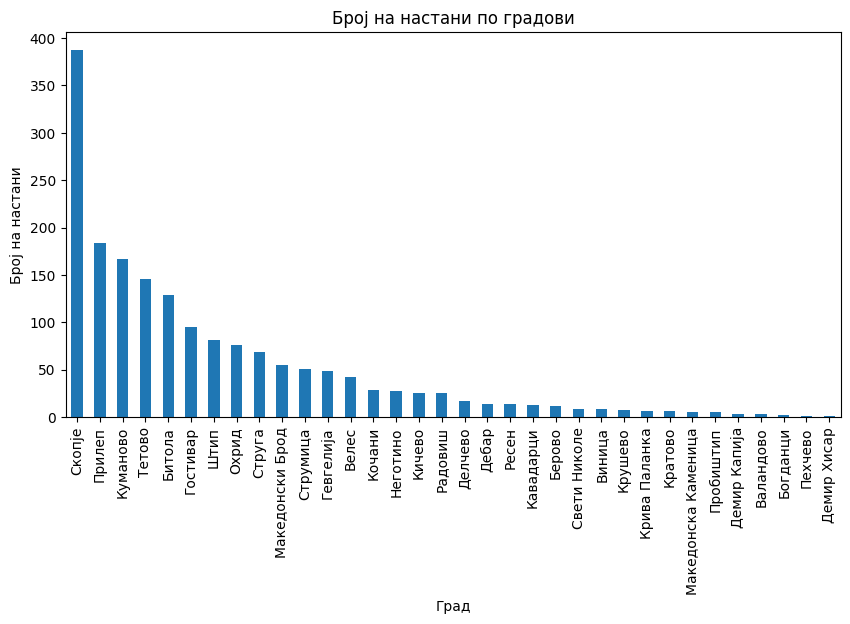

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (387), а најмалце во Пехчево (1) и Демир Хисар (1).

---

#### 5.4.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

кражба       399
друго        392
сообраќај    288
насилство    268
дрога        153
пиштол       145
документи    120
Name: shto, dtype: int64

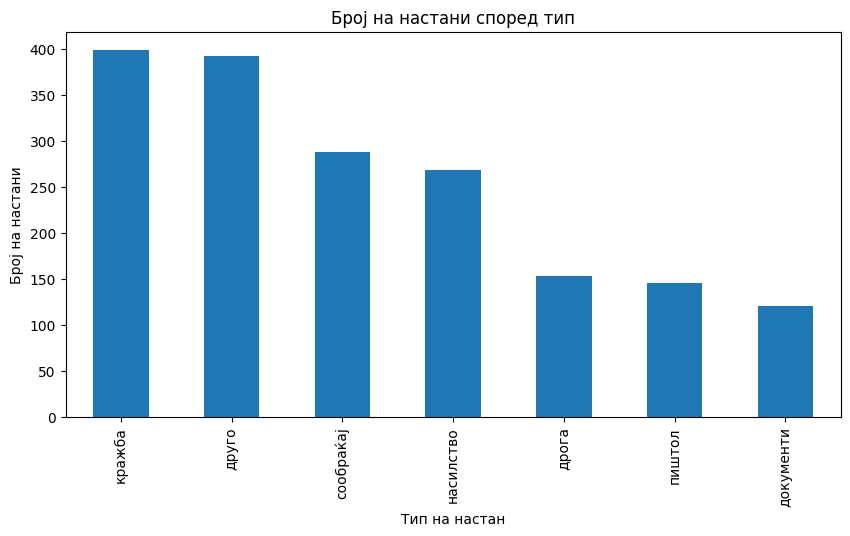

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле кражби и некласифицирани настани.

---

#### 5.4.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

11    210
12    193
8     164
4     161
3     151
6     139
9     132
5     131
1     130
7     129
10    123
2     102
Name: month, dtype: int64

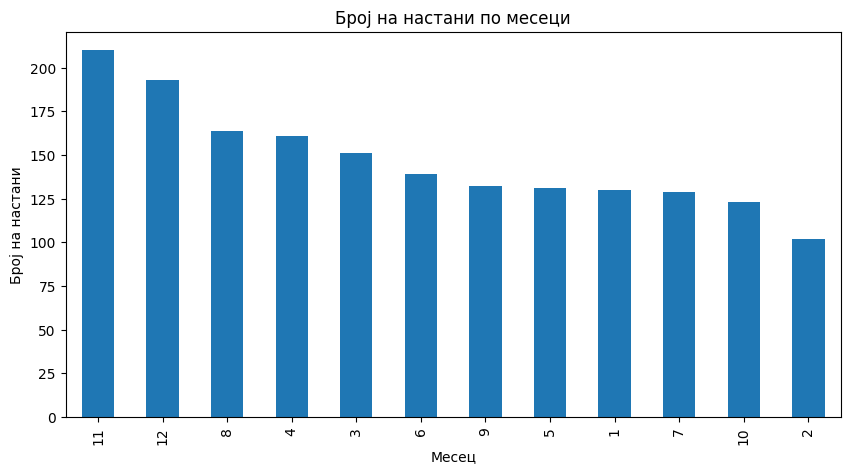

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Ноември и Декември, додека пак најмалце во Февруари.

---

#### 5.4.4. Анализа по градови и тип на настан

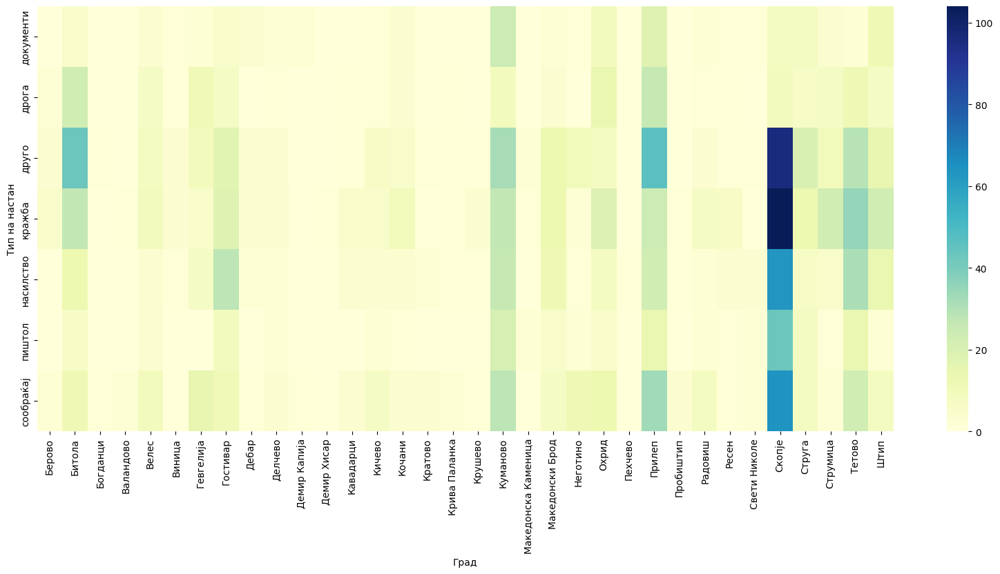

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Покрај Скопје, во Прилеп и Битола се забележува поголем број на регистирани настани во однос на претходните години.

---

### 5.5. 2016 година

In [ ]:
df_new=df[df['year'] == 2016]

In [ ]:
df_new.shape[0]

2447

Во 2016 биле регистрирани вкупно 2447 настани.

---

#### 5.5.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 588
Прилеп                 231
Куманово               212
Битола                 165
Тетово                 162
Гостивар               140
Охрид                   94
Струмица                92
Штип                    90
Велес                   84
Македонски Брод         66
Кичево                  57
Гевгелија               53
Струга                  53
Радовиш                 43
Кочани                  39
Делчево                 36
Кавадарци               32
Неготино                31
Свети Николе            27
Берово                  23
Ресен                   19
Крива Паланка           17
Демир Капија            16
Дебар                   14
Крушево                 14
Виница                  12
Валандово               12
Пробиштип               10
Кратово                  6
Македонска Каменица      3
Богданци                 3
Пехчево                  2
Демир Хисар              1
Name: grad, dtype: int64

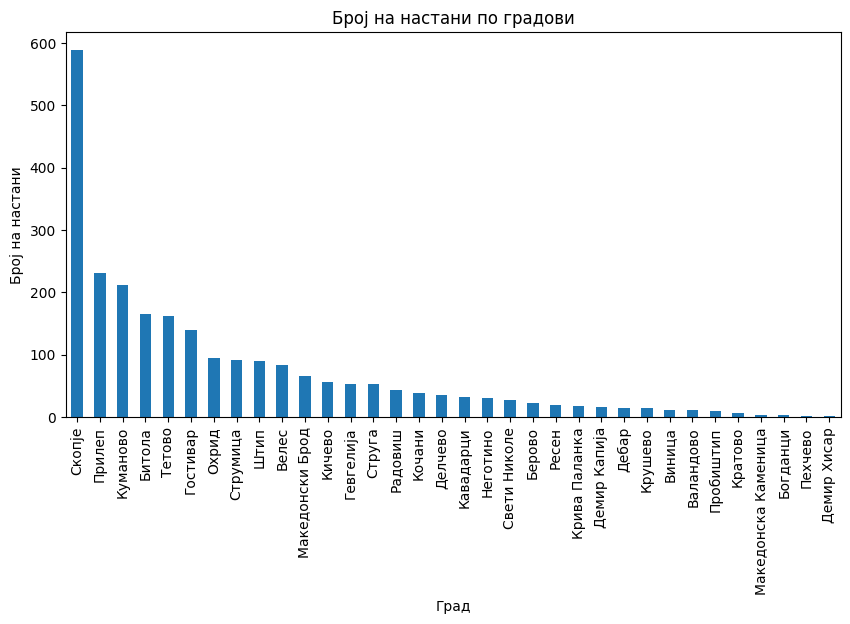

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (588), а најмалце во Демир Хисар (1).

---

#### 5.5.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        633
сообраќај    580
кражба       467
насилство    362
пиштол       147
дрога        132
документи    126
Name: shto, dtype: int64

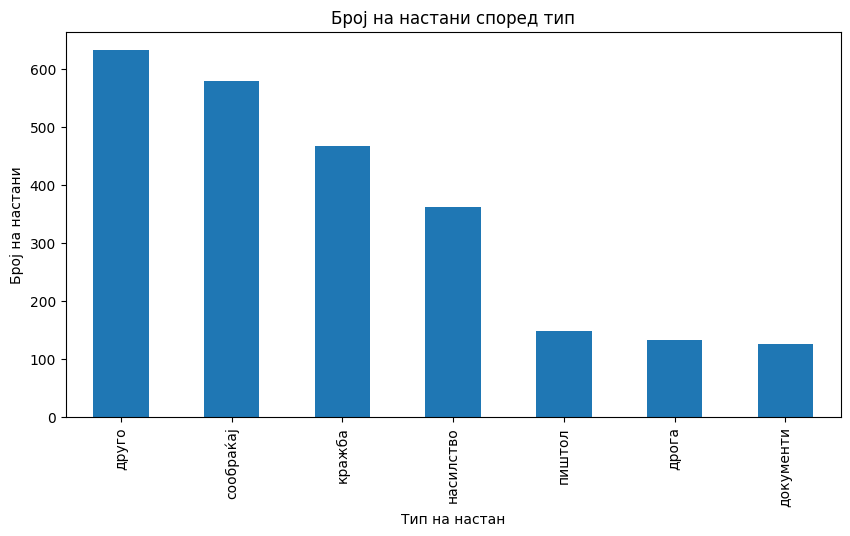

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле некласифицирани настани и настани поврзани со сообраќај.

---

#### 5.5.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

3     260
8     247
7     234
2     232
12    219
10    209
5     193
1     187
4     187
6     180
11    163
9     136
Name: month, dtype: int64

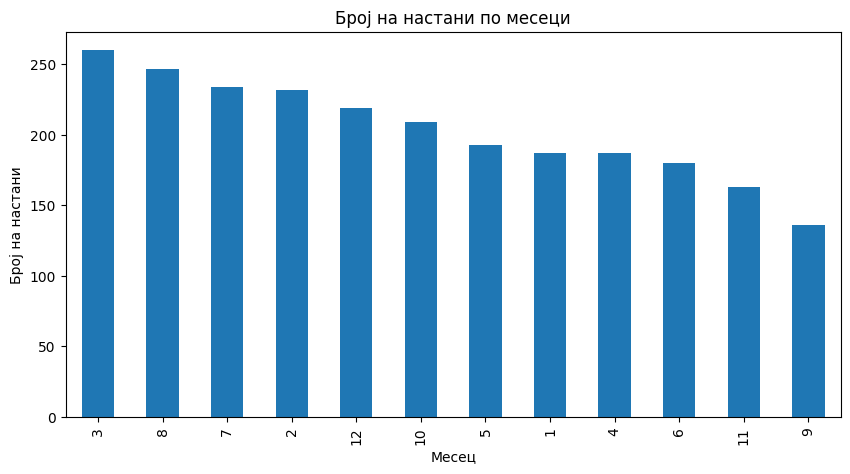

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Март и Август, а најмалце во Септември.

---

#### 5.5.4. Анализа по градови и тип на настан

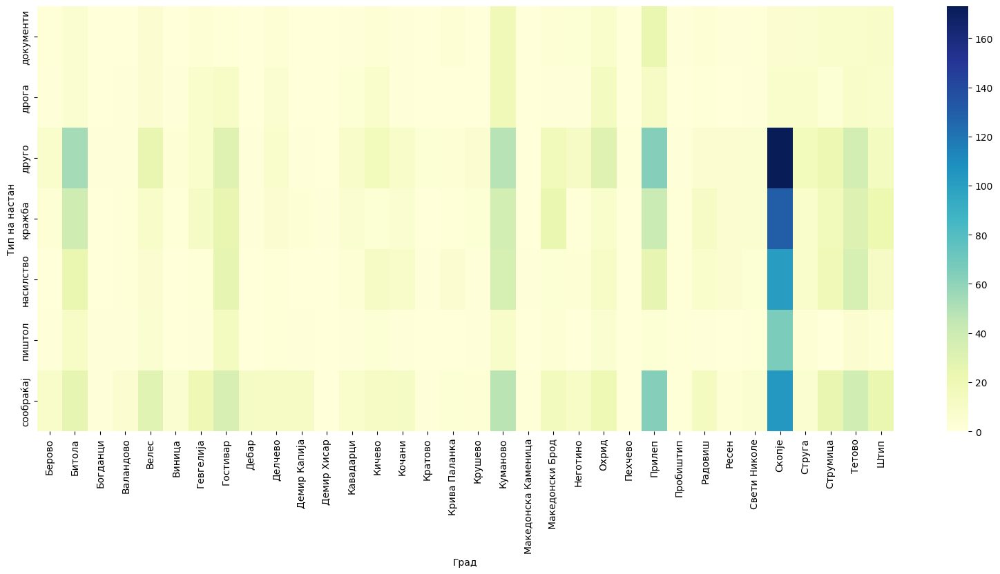

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

После Скопје, најмногу настани поврзани со сообраќај се случиле во Прилеп и Куманово.

---

### 5.6. 2017 година

In [ ]:
df_new=df[df['year'] == 2017]

In [ ]:
df_new.shape[0]

1972

Во 2017 биле регистрирани вкупно 1972 настани.

---

#### 5.6.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 698
Тетово                 164
Прилеп                 150
Гостивар               106
Битола                 102
Куманово                92
Охрид                   89
Струмица                58
Штип                    51
Струга                  50
Кичево                  44
Велес                   44
Македонски Брод         44
Кавадарци               28
Делчево                 28
Неготино                25
Радовиш                 22
Кочани                  20
Гевгелија               20
Дебар                   16
Ресен                   15
Виница                  15
Крива Паланка           13
Свети Николе            12
Берово                  11
Пробиштип                9
Валандово                9
Крушево                  9
Кратово                  6
Демир Хисар              6
Демир Капија             6
Пехчево                  5
Богданци                 3
Македонска Каменица      2
Name: grad, dtype: int64

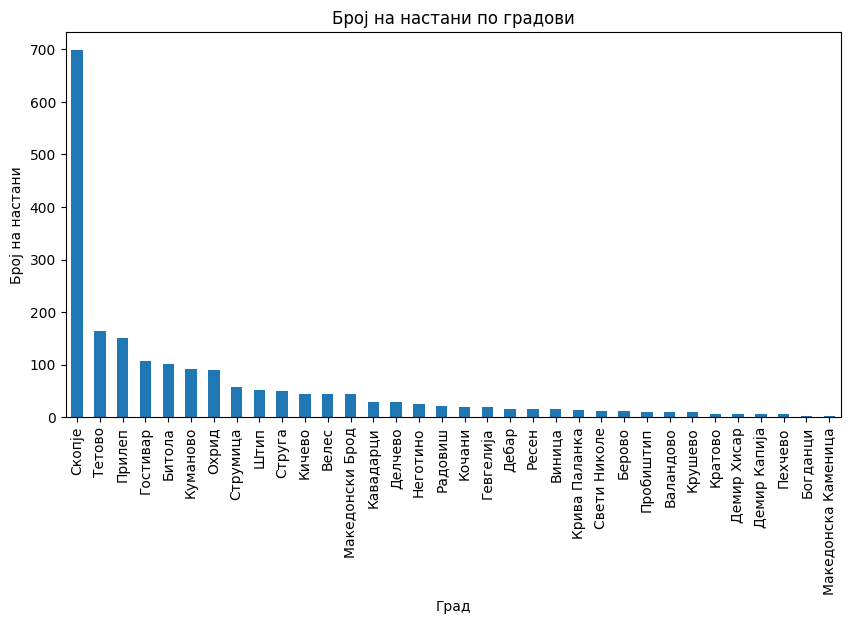

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (698), а најмалце во Македонска Каменица (2).

---

#### 5.6.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        582
сообраќај    464
кражба       406
насилство    280
пиштол       132
дрога         64
документи     44
Name: shto, dtype: int64

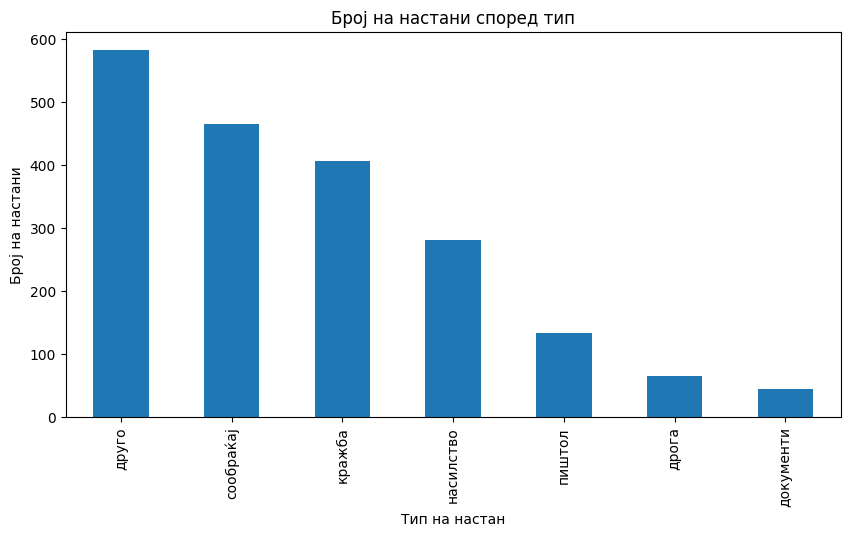

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле некласифицирани настани и настани поврзани со сообраќај.

---

#### 5.6.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

3     228
1     217
5     208
7     189
10    189
6     170
4     156
12    156
2     149
11    140
8     112
9      58
Name: month, dtype: int64

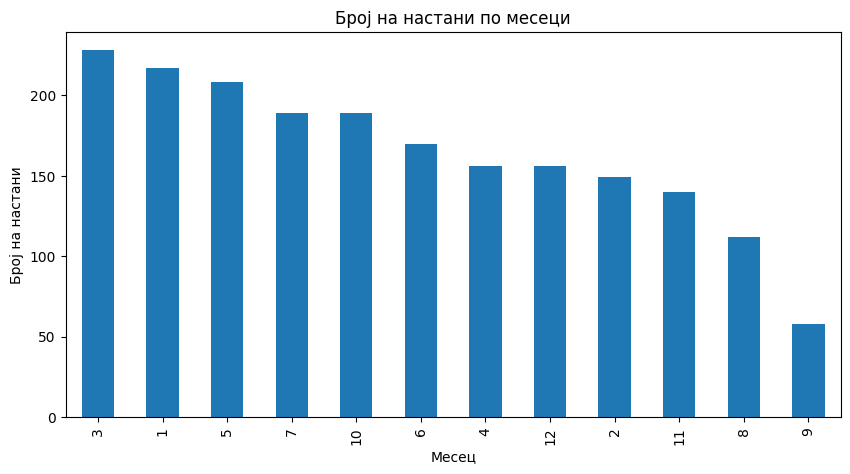

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Јануари, Март и Мај, додека пак најмалце во Септември.

---

#### 5.6.4. Анализа по градови и тип на настан

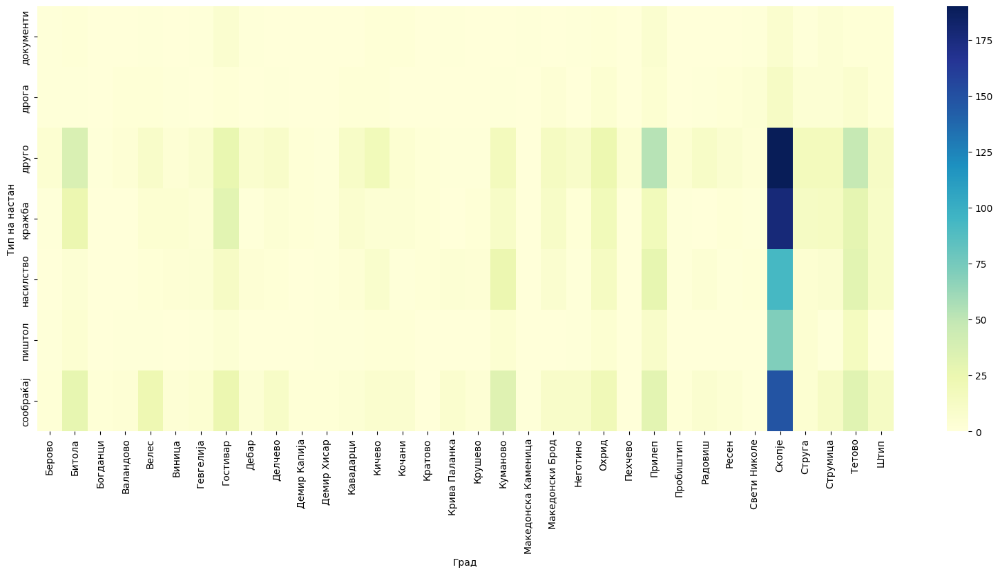

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Горниот граф покажува дека нема некои драстични девијации во однос на претходните години.

---

### 5.7. 2018 година

In [ ]:
df_new=df[df['year'] == 2018]

In [ ]:
df_new.shape[0]

1961

Во 2018 биле регистрирани вкупно 1961 настани.

---

#### 5.7.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 781
Тетово                 174
Прилеп                 122
Гостивар               114
Битола                  88
Куманово                81
Велес                   61
Охрид                   58
Струга                  52
Штип                    48
Македонски Брод         44
Кичево                  40
Струмица                39
Кочани                  28
Неготино                22
Кавадарци               21
Гевгелија               20
Ресен                   18
Радовиш                 17
Крива Паланка           17
Делчево                 15
Македонска Каменица     15
Дебар                   14
Крушево                 12
Пробиштип               11
Свети Николе            11
Берово                  11
Демир Капија             7
Кратово                  6
Виница                   6
Валандово                4
Богданци                 3
Демир Хисар              1
Пехчево                  0
Name: grad, dtype: int64

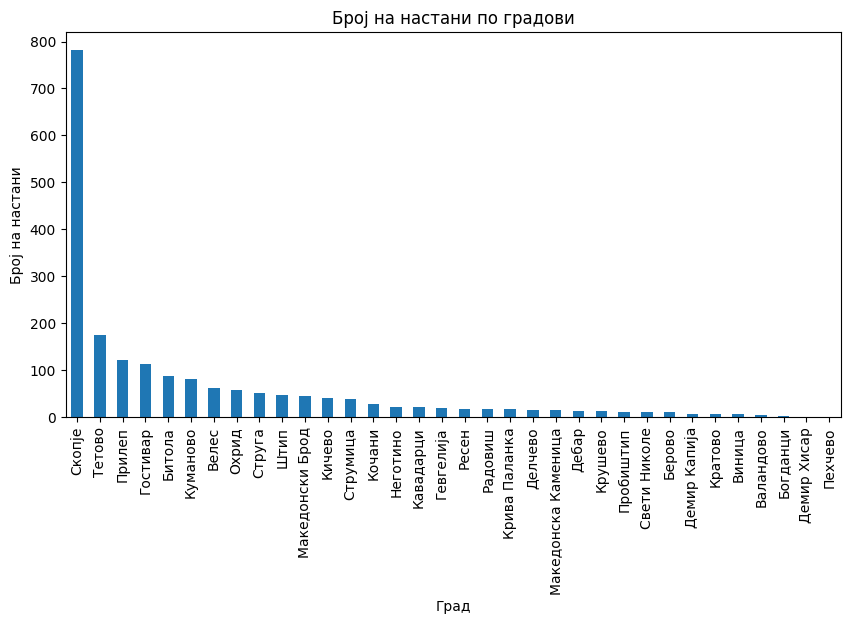

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (781), а најмалце во Пехчево (1).

---

#### 5.7.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

сообраќај    752
друго        487
насилство    295
кражба       221
пиштол       105
дрога         73
документи     28
Name: shto, dtype: int64

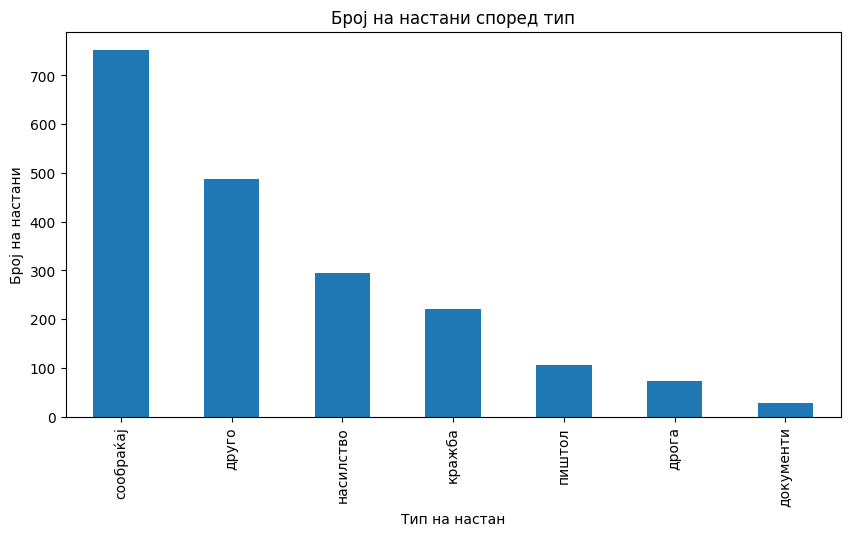

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле настани поврзани со сообраќај.

---

#### 5.7.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

6     295
8     269
5     267
4     265
3     223
7     188
1     159
2     135
12     48
11     47
9      36
10     29
Name: month, dtype: int64

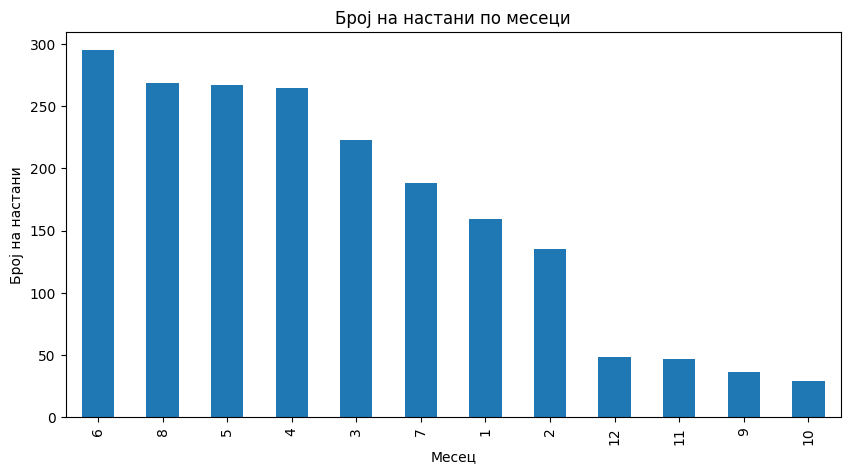

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Мај, Јуни и Август, додека пак најмалце во крајните месеци од годината Септември, Октомври, Ноември и Декември.

---

#### 5.7.4. Анализа по градови и тип на настан

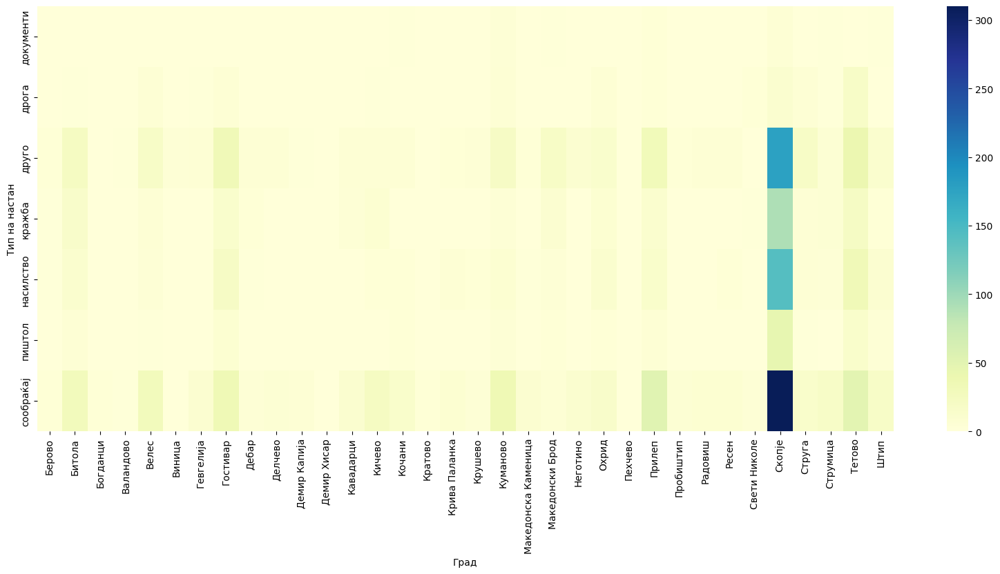

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Горниот граф покажува дека нема некои драстични девијации во однос на претходните години.

---

### 5.8. 2019 година

In [ ]:
df_new=df[df['year'] == 2019]

In [ ]:
df_new.shape[0]

1742

Во 2019 биле регистрирани вкупно 1742 настани.

---

#### 5.8.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 665
Тетово                 166
Прилеп                 157
Битола                 117
Куманово               100
Гостивар                97
Велес                   65
Охрид                   60
Струмица                47
Струга                  29
Штип                    28
Кавадарци               24
Крива Паланка           23
Гевгелија               23
Кичево                  21
Кочани                  21
Неготино                18
Радовиш                 15
Македонски Брод         11
Дебар                   11
Берово                  10
Демир Капија             6
Делчево                  5
Валандово                4
Македонска Каменица      3
Кратово                  3
Виница                   3
Пробиштип                2
Свети Николе             2
Богданци                 2
Крушево                  2
Пехчево                  1
Ресен                    1
Демир Хисар              0
Name: grad, dtype: int64

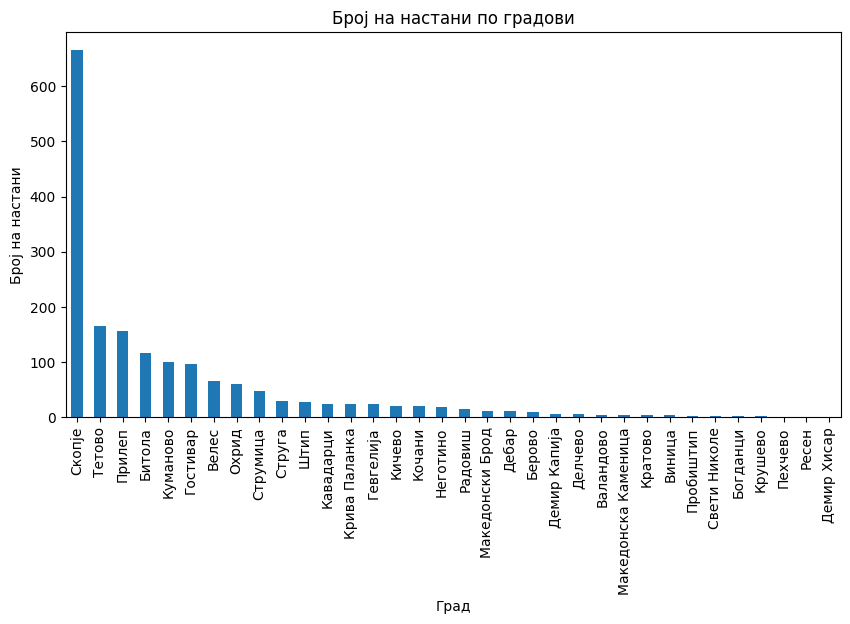

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (665), а најмалце во Демир Хисар (0).

---

#### 5.8.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        732
сообраќај    668
дрога        164
кражба        69
документи     46
насилство     37
пиштол        26
Name: shto, dtype: int64

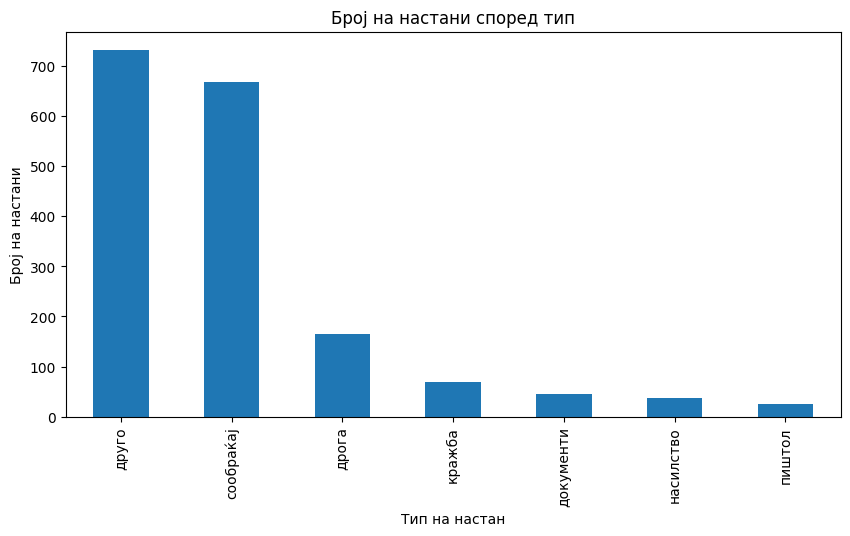

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле некласифицирани настани и поврзани со сообраќај.

---

#### 5.8.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

10    304
9     281
12    260
11    253
8     221
7     136
6      69
3      65
4      50
5      43
2      31
1      29
Name: month, dtype: int64

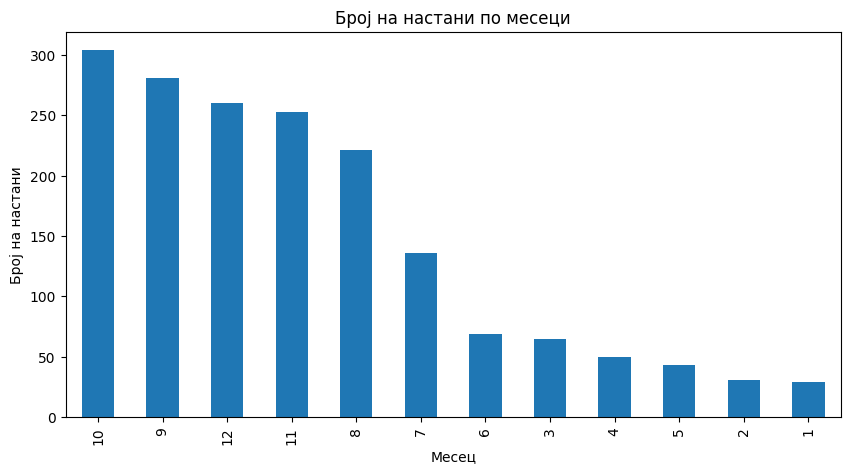

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Септември и Октомври, додека пак најмале во Јануари и Февруари.

---

#### 5.8.4. Анализа по градови и тип на настан

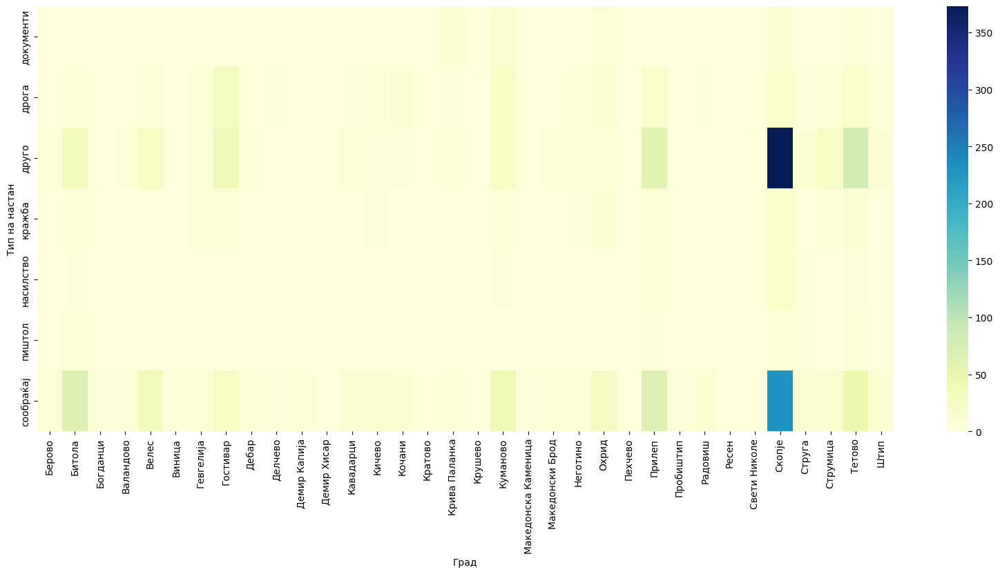

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Горниот граф покажува дека има намалување во бројот на настани поврзани со кражби, насилство и оружје во Скопје, во споредба со претходните години.

---

### 5.9. 2020 година

In [ ]:
df_new=df[df['year'] == 2020]

In [ ]:
df_new.shape[0]

4548

Во 2020 биле регистрирани вкупно 4548 настани.

---

#### 5.9.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 1913
Тетово                  385
Прилеп                  239
Гостивар                216
Битола                  185
Куманово                181
Охрид                   162
Велес                   146
Штип                    142
Струмица                119
Кичево                  119
Струга                   97
Македонски Брод          81
Кочани                   69
Кавадарци                64
Свети Николе             50
Радовиш                  44
Неготино                 43
Делчево                  39
Дебар                    34
Гевгелија                31
Крива Паланка            30
Берово                   25
Демир Капија             20
Пробиштип                18
Ресен                    16
Виница                   16
Кратово                  15
Крушево                  14
Валандово                13
Богданци                 10
Македонска Каменица       6
Пехчево                   4
Демир Хисар               2
Name: grad, dtype: int64

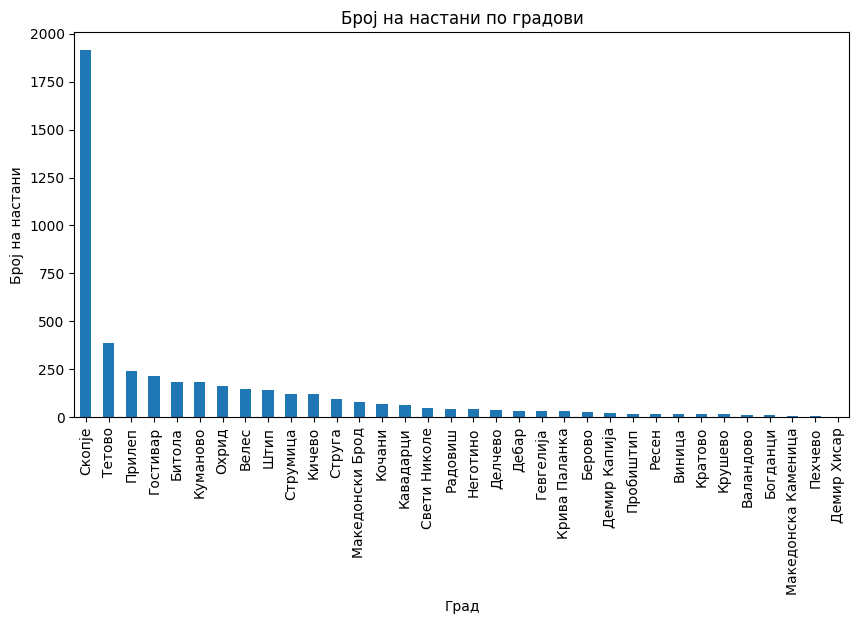

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (1913), а најмалце во Демир Хисар (2).

---

#### 5.9.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        1898
сообраќај    1124
насилство     687
дрога         298
кражба        268
пиштол        212
документи      61
Name: shto, dtype: int64

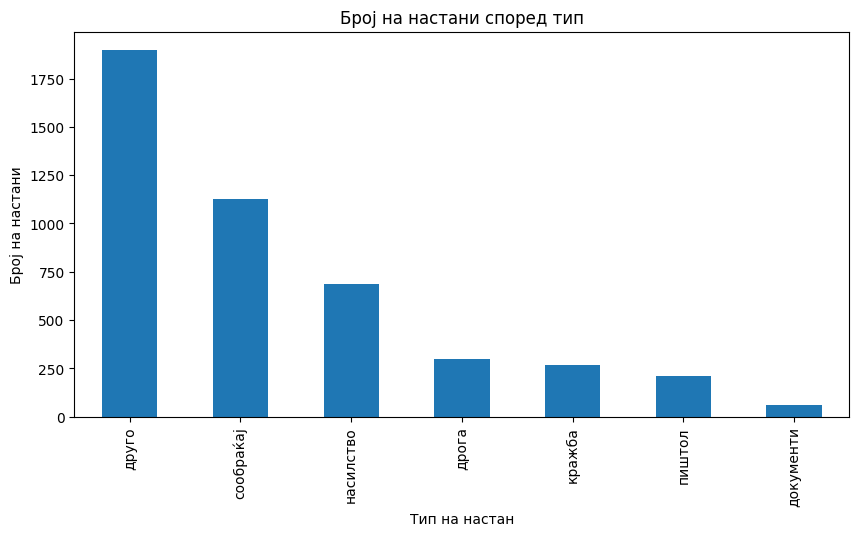

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Најголем дел од настаните биле некласифицирани настани.

---

#### 5.9.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

9     638
10    626
8     563
11    526
12    360
5     338
3     304
2     292
7     268
1     253
6     192
4     188
Name: month, dtype: int64

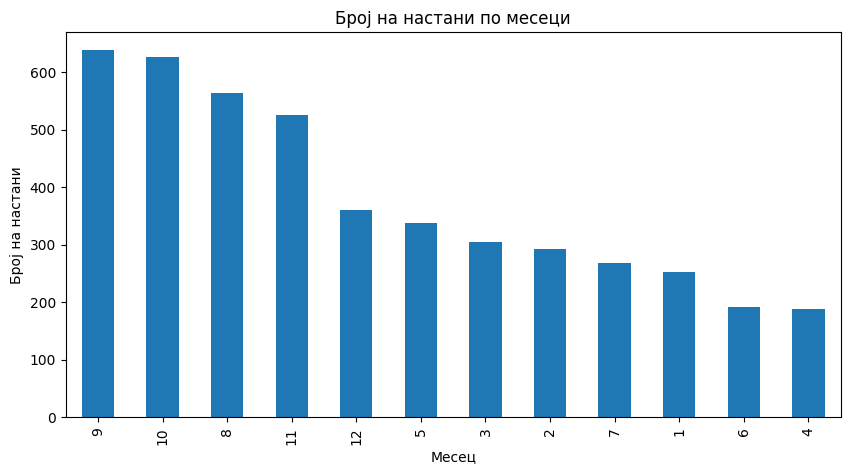

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Август, Септември и Октомври.

---

#### 5.9.4. Анализа по градови и тип на настан

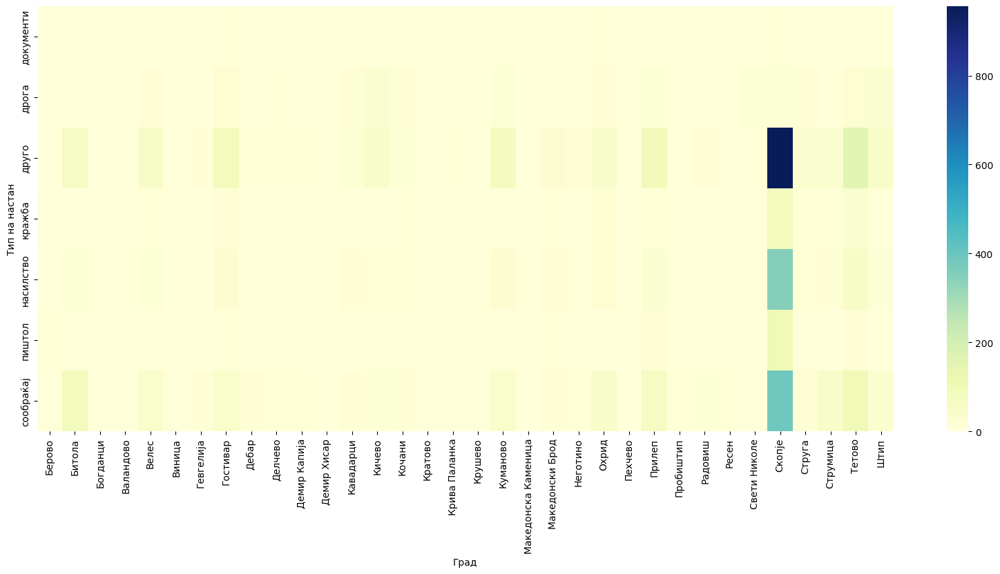

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Горниот граф покажува дека во сите поголеми градови (Скопје, Тетово, Битола, Гостивар, Велес, Куманово, Прилеп) има зголемен број на некласифицирани настани. Со оглед на тоа дека во 2020 година започна пандемијата со Ковид-19, голем број од овие настани се поврзани со прекршоци на владините мерки за спречување на вирусот (полициски час, задолжително носење маски, забрането групирање)

---

### 5.10. 2021 година

In [ ]:
df_new=df[df['year'] == 2021]

In [ ]:
df_new.shape[0]

11217

Во 2021 биле регистрирани вкупно 11217 настани.

---

#### 5.10.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 4294
Тетово                  982
Прилеп                  674
Битола                  594
Гостивар                584
Штип                    511
Куманово                498
Берово                  444
Охрид                   375
Велес                   323
Струмица                314
Кичево                  288
Струга                  191
Македонски Брод         163
Кочани                  149
Дебар                   126
Гевгелија               118
Кавадарци               107
Неготино                 94
Свети Николе             63
Виница                   54
Делчево                  49
Крива Паланка            34
Валандово                33
Кратово                  25
Крушево                  23
Пробиштип                22
Демир Капија             21
Ресен                    19
Радовиш                  12
Македонска Каменица      11
Пехчево                   8
Демир Хисар               8
Богданци                  6
Name: grad, dtype: int64

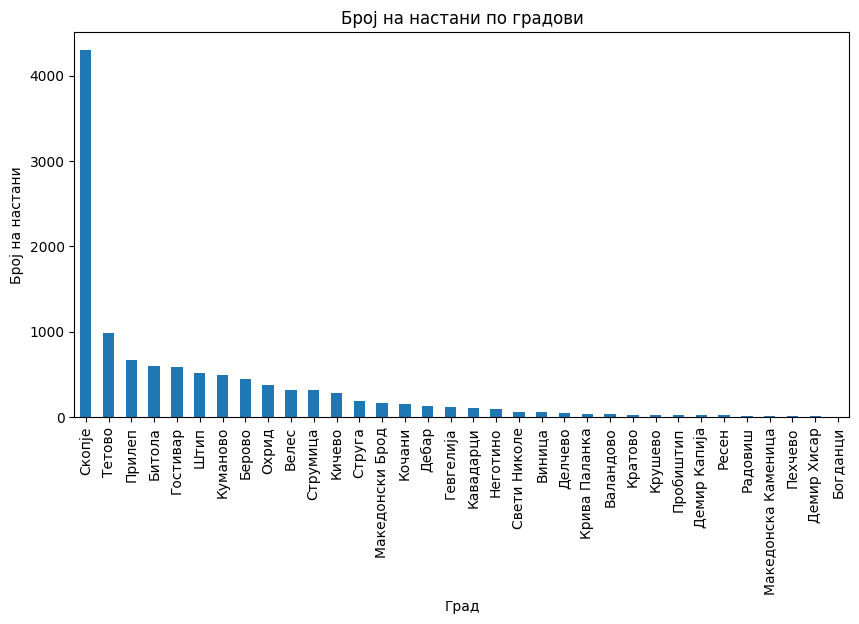

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (4294), а најмалце во Богданци (6).

---

#### 5.10.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        4643
сообраќај    2565
насилство    2105
кражба        956
дрога         474
пиштол        259
документи     215
Name: shto, dtype: int64

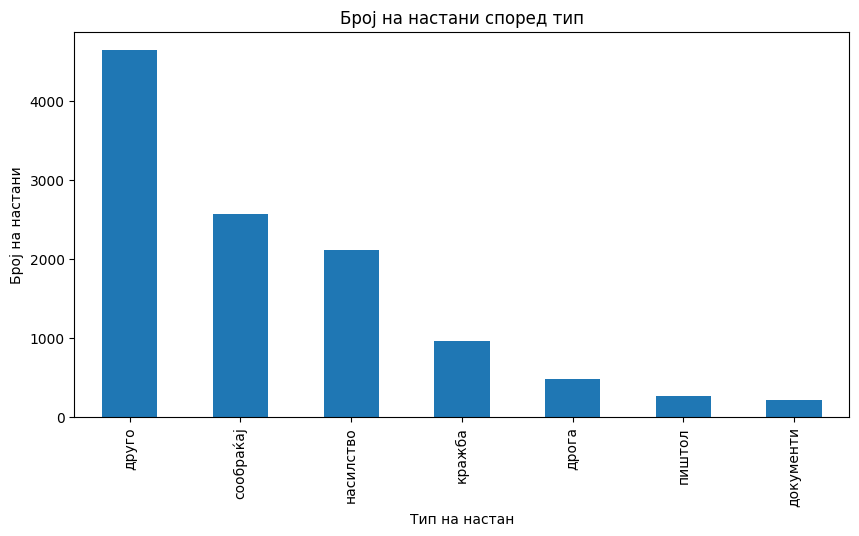

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Слично како и во 2020 година, најголем дел од настаните биле некласифицирани настани.

---

#### 5.10.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

12    1388
9     1232
7     1184
11    1151
10    1144
8     1050
6      976
2      720
5      687
4      631
3      538
1      516
Name: month, dtype: int64

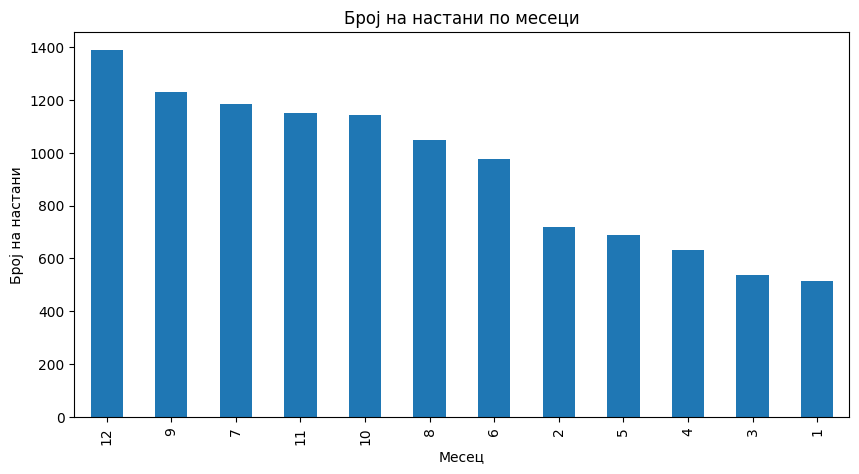

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Декември а најмалце во Јануари.

---

#### 5.10.4. Анализа по градови и тип на настан

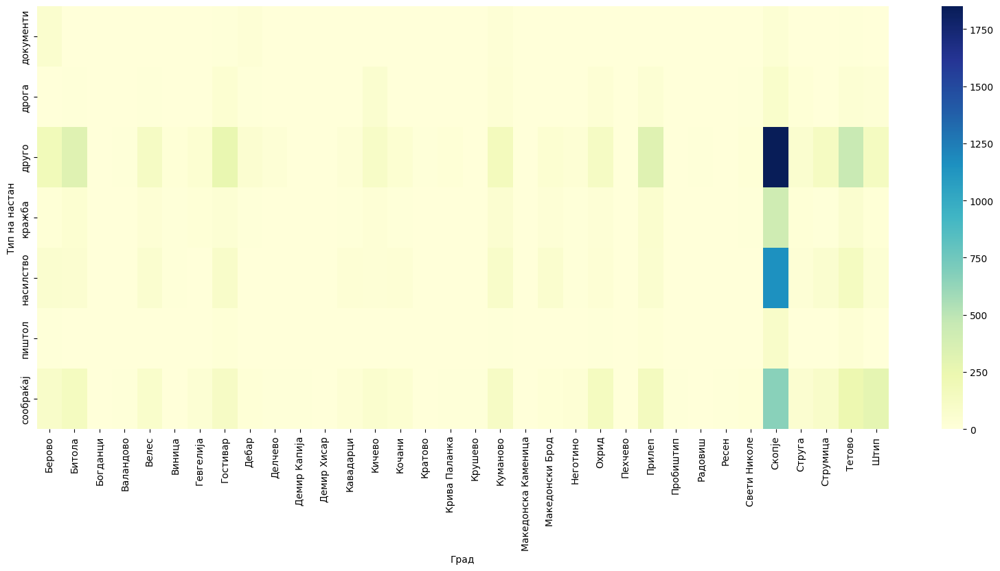

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Поради пандемијата, и во 2021 година е забележан најголем број на некласифицирани настани. Дополнително може да се забележи дека има драстично намален број на кражби - тоа може да е поради фактот дека најголем дел од времето луѓето го врвеа дома - поради карантин, полициски час и слично.

---

### 5.11. 2022 година

In [ ]:
df_new=df[df['year'] == 2022]

In [ ]:
df_new.shape[0]

8466

Во 2022 биле регистрирани вкупно 8466 настани.

---

#### 5.11.1. Анализа по градови

In [ ]:
df_new['grad'].value_counts()

Скопје                 2374
Прилеп                 1209
Тетово                  874
Битола                  632
Штип                    510
Гостивар                422
Куманово                392
Берово                  363
Велес                   268
Струмица                237
Охрид                   211
Кичево                  166
Кавадарци               104
Македонски Брод          89
Струга                   88
Неготино                 84
Кочани                   72
Гевгелија                69
Свети Николе             32
Дебар                    32
Виница                   31
Делчево                  26
Демир Капија             25
Валандово                24
Македонска Каменица      20
Крива Паланка            20
Пробиштип                17
Радовиш                  16
Кратово                  14
Богданци                 13
Ресен                    12
Крушево                  11
Пехчево                   5
Демир Хисар               4
Name: grad, dtype: int64

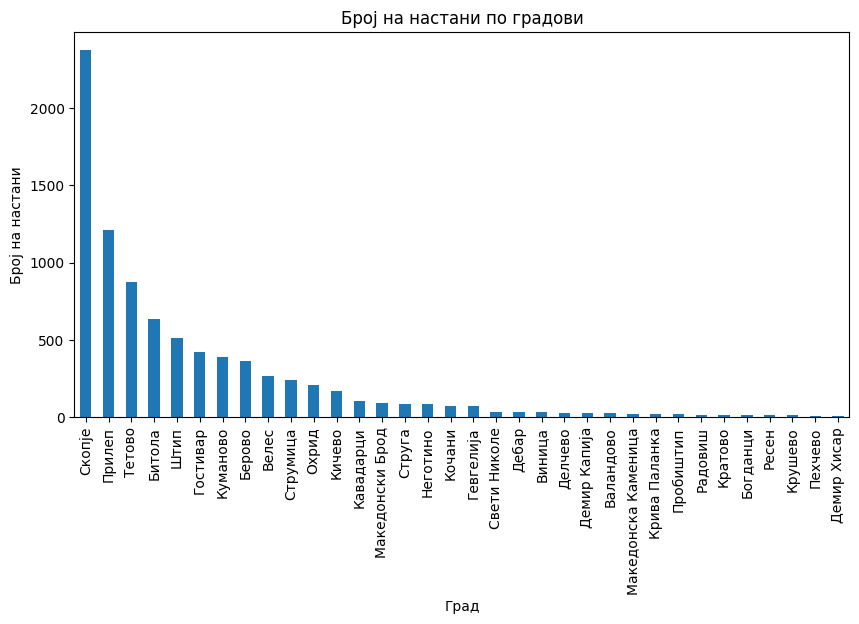

In [ ]:
plt.figure(figsize=(10, 5))
df_new['grad'].value_counts().plot(kind='bar')
plt.xlabel('Град')
plt.ylabel('Број на настани')
plt.title("Број на настани по градови")
plt.show()

Најмногу настани се случиле во Скопје (2374), а најмалце во Демир Хисар (4).

---

#### 5.11.2. Анализа по тип на настан

In [ ]:
df_new['shto'].value_counts()

друго        4057
сообраќај    2497
кражба       1057
насилство     445
дрога         228
пиштол        150
документи      32
Name: shto, dtype: int64

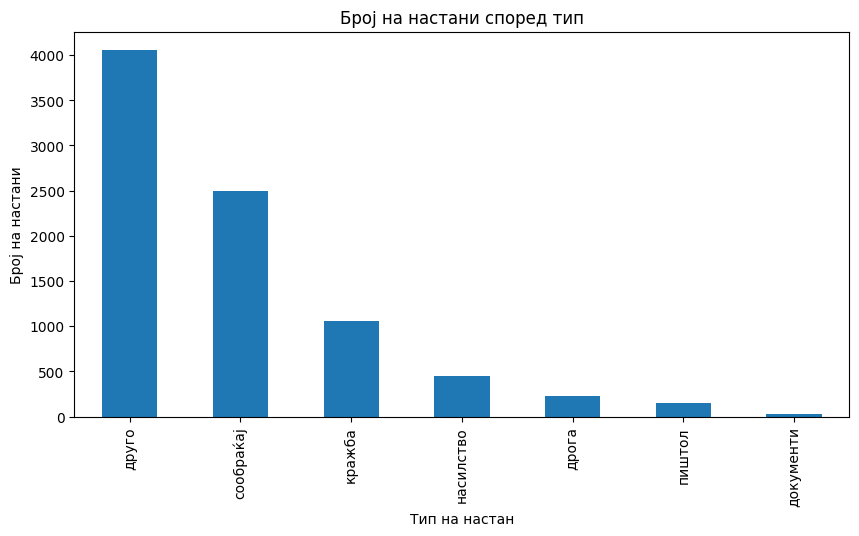

In [ ]:
plt.figure(figsize=(10, 5))
df_new['shto'].value_counts().plot(kind='bar')
plt.xlabel('Тип на настан')
plt.ylabel('Број на настани')
plt.title("Број на настани според тип")
plt.show()

Слично како и во претходните две години, најголем дел од настаните биле некласифицирани настани.

---

#### 5.11.3. Анализа по месеци

In [ ]:
df_new['month'].value_counts()

2     1062
1     1055
12     690
11     676
9      669
5      654
8      637
10     631
6      617
3      605
7      590
4      580
Name: month, dtype: int64

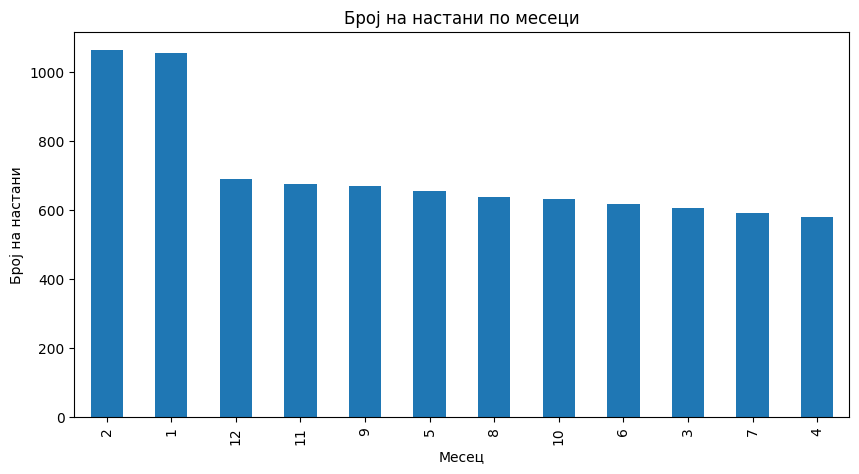

In [ ]:
plt.figure(figsize=(10, 5))
df_new['month'].value_counts().plot(kind='bar')
plt.xlabel('Месец')
plt.ylabel('Број на настани')
plt.title("Број на настани по месеци")
plt.show()

Најмногу настани биле регистрирани во Јануари и Февруари.

---

#### 5.11.4. Анализа по градови и тип на настан

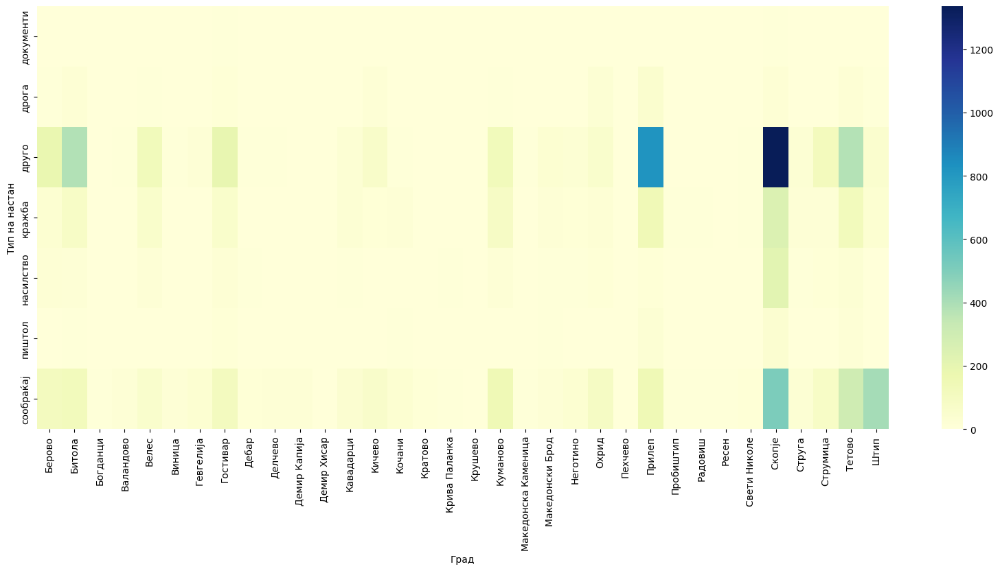

In [ ]:
grouped = df_new.groupby(['shto', 'grad']).size().reset_index(name='count')

# Create a pivot table for better visualization
pivot = grouped.pivot(index='shto', columns='grad', values='count')

plt.figure(figsize=(20, 8))
# Plot a heatmap using seaborn
sns.heatmap(pivot, cmap='YlGnBu')

plt.xlabel('Град')
plt.ylabel('Тип на настан')

# Show the plot
plt.show()

Во 2022 година има драстично зголемен број на некласифицирани настани во Прилеп, како и благ раст во Битола и Тетово. Дополнително има раст во бројот на настани поврзани со сообраќај во Тетово и Штип.

---

## 6. Заклучок
---

Во рамките на овој проект беше направена анализа на податоците од криминалистички податоци во Македонија.


На почетокот се инсталирани и импортирани сите потребни модули и библиотеки, а потоа вчитани се и податоците кои што оригинално се во XML формат. Податоците се трансфомирани во Pandas Dataframe којшто се користи за понатамошна анализа.

Од податоците се отстранети колони кои што не носат семантичка важност, но, додаени се и нови колони за месец и година кога се случил настанот. Исто така сите настани каде фалеа податоци (тоа беа помалце од 2%), беа отфрлени.

Во Секција 4. беше направена основна анализа врз сите податоци според која може да се доведат следните заклучоци:
*    Најмногу настани се случиле во Скопје (13648), а најмалце во Демир Хисар (31).
*    Најголем број од настаните не се класифицирани (15829).
*    Најголем број од настаните се регистирани во 2021 година (11217).
*    Месец со најголем број на регистрирани настани е Декември 2021 година.


Во Секција 5. беше направена годишна анализа врз податоците во периодот од 2012 до 2022 година, за секоја година поединечно. Од оваа анализа може да се заклучи дека:
*    Главниот град Скопје континуирано има најголем број на регистрирани настани.
*    Другите поголеми градови како Битола, Тетово и Прилеп следат после Скопје по бројот на настани.
*    Потојат и други поголеми градови кои имаат значително помал број на настани низ текот на годините (Охрид и Струмица).
*    Најмалите градови имаат најмал број на настани (Демир Хисар, Пехчево, Богданци)
*    Исклучок е Македонски Брод којшто има број на регистрирани настани многу поголем од другите градови со слична големина.
*    Најголем број од настаните се регистрирани во периодот од 2020 до 2022 година - причина за ова може да е пандемијата со Ковид-19, кога имаше зголемен број на прекршоци на карантините, полициските часови и останатите мерки.
*   Месеци со најмногу настани се Февруари, Октомври и Декември, додека пак најмирни месеци се Април, Мај и Јуни.
*    Според податоците НЕ ПОСТОЈАТ одредени датуми кои континуирано низ годините имаат висок број на настани (Нова Година, 1ви Мај).

---